# Fine-tuned Image Super-Resolution with VDSR (Optuna-Tuned Model)
## Implementation Overview
This notebook presents a fine-tuned implementation of the Very Deep Super-Resolution (VDSR) network for single-image super-resolution.
Instead of relying on default architecture, we use Optuna to search for the best depth, filters, and learning rate to better fit the dataset characteristics.

The model is trained and validated on an expanded dataset of 200 images each for training, validation, and testing to improve generalization performance.

## Data Preparation
We work with 600 total image pairs (200 for training, 200 for validation, 200 for testing).
The low-resolution (LR) images are preprocessed using bicubic interpolation, and the model learns to predict the residual between the LR and corresponding high-resolution (HR) images.



In [1]:
!pip install huggingface_hub

In [2]:
from huggingface_hub import HfApi, hf_hub_download
from pathlib import Path
import os
import time

# Initialize HF API
api = HfApi()

# Dataset repository
repo_id = "ericphann/video-game-super-resolution"

# Define folders
folders = [
    "test-hr", "test-lr",
    "training-hr", "training-lr",
    "validation-hr", "validation-lr"
]

# Create local directory
local_dir = "super_res_subset"
os.makedirs(local_dir, exist_ok=True)

# Download first 1000 images from each folder
for folder in folders:
    # Get list of files in the folder
    all_files = api.list_repo_files(repo_id, repo_type="dataset")
    folder_files = [f for f in all_files if f.startswith(folder + "/")]

    # Sort files and take first 1000
    files_sorted = sorted(folder_files)[:200]

    # Download each file with a delay
    for file in files_sorted:
        hf_hub_download(
            repo_id=repo_id,
            filename=file,
            repo_type="dataset",
            local_dir=os.path.join(local_dir, os.path.dirname(file)),
            local_dir_use_symlinks=False
        )
        # Wait for a short time to avoid rate limiting
        time.sleep(1) # Wait for 1 second before the next request
    print(f"Downloaded {len(files_sorted)} images from {folder}")


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/huggingface_hub/file_download.py:933: UserWarning: `local_dir_use_symlinks` parameter is deprecated and will be ignored. The process to download files to a local folder has been updated and do not rely on symlinks anymore. You only need to pass a destination folder as`local_dir`.
For more details, check out https://huggingface.co/docs/huggingface_hub/main/en/guides/download#download-files-to-local-folder.
  warnings.warn(


12266.png:   0%|          | 0.00/3.33M [00:00<?, ?B/s]

12267.png:   0%|          | 0.00/4.19M [00:00<?, ?B/s]

12268.png:   0%|          | 0.00/3.24M [00:00<?, ?B/s]

12269.png:   0%|          | 0.00/2.82M [00:00<?, ?B/s]

12270.png:   0%|          | 0.00/2.56M [00:00<?, ?B/s]

12271.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

12272.png:   0%|          | 0.00/3.59M [00:00<?, ?B/s]

12273.png:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

12274.png:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

12275.png:   0%|          | 0.00/2.80M [00:00<?, ?B/s]

12276.png:   0%|          | 0.00/2.93M [00:00<?, ?B/s]

12277.png:   0%|          | 0.00/3.17M [00:00<?, ?B/s]

12278.png:   0%|          | 0.00/3.55M [00:00<?, ?B/s]

12279.png:   0%|          | 0.00/2.94M [00:00<?, ?B/s]

12280.png:   0%|          | 0.00/3.79M [00:00<?, ?B/s]

12281.png:   0%|          | 0.00/3.30M [00:00<?, ?B/s]

12282.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

12283.png:   0%|          | 0.00/3.73M [00:00<?, ?B/s]

12284.png:   0%|          | 0.00/3.20M [00:00<?, ?B/s]

12285.png:   0%|          | 0.00/3.68M [00:00<?, ?B/s]

12286.png:   0%|          | 0.00/4.27M [00:00<?, ?B/s]

12287.png:   0%|          | 0.00/3.42M [00:00<?, ?B/s]

12288.png:   0%|          | 0.00/3.88M [00:00<?, ?B/s]

12289.png:   0%|          | 0.00/3.18M [00:00<?, ?B/s]

12290.png:   0%|          | 0.00/2.34M [00:00<?, ?B/s]

12291.png:   0%|          | 0.00/4.29M [00:00<?, ?B/s]

12292.png:   0%|          | 0.00/3.47M [00:00<?, ?B/s]

12293.png:   0%|          | 0.00/2.63M [00:00<?, ?B/s]

12294.png:   0%|          | 0.00/3.39M [00:00<?, ?B/s]

12295.png:   0%|          | 0.00/3.20M [00:00<?, ?B/s]

12296.png:   0%|          | 0.00/3.26M [00:00<?, ?B/s]

12297.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

12298.png:   0%|          | 0.00/4.20M [00:00<?, ?B/s]

12299.png:   0%|          | 0.00/2.77M [00:00<?, ?B/s]

12300.png:   0%|          | 0.00/2.73M [00:00<?, ?B/s]

12301.png:   0%|          | 0.00/2.99M [00:00<?, ?B/s]

12302.png:   0%|          | 0.00/3.17M [00:00<?, ?B/s]

12303.png:   0%|          | 0.00/4.47M [00:00<?, ?B/s]

12304.png:   0%|          | 0.00/2.85M [00:00<?, ?B/s]

12305.png:   0%|          | 0.00/4.17M [00:00<?, ?B/s]

12306.png:   0%|          | 0.00/2.99M [00:00<?, ?B/s]

12307.png:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

12308.png:   0%|          | 0.00/2.47M [00:00<?, ?B/s]

12309.png:   0%|          | 0.00/3.30M [00:00<?, ?B/s]

12310.png:   0%|          | 0.00/2.67M [00:00<?, ?B/s]

12311.png:   0%|          | 0.00/3.29M [00:00<?, ?B/s]

12312.png:   0%|          | 0.00/3.52M [00:00<?, ?B/s]

12313.png:   0%|          | 0.00/3.69M [00:00<?, ?B/s]

12314.png:   0%|          | 0.00/4.16M [00:00<?, ?B/s]

12315.png:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

12316.png:   0%|          | 0.00/1.71M [00:00<?, ?B/s]

12317.png:   0%|          | 0.00/3.85M [00:00<?, ?B/s]

12318.png:   0%|          | 0.00/3.39M [00:00<?, ?B/s]

12319.png:   0%|          | 0.00/3.24M [00:00<?, ?B/s]

12320.png:   0%|          | 0.00/3.73M [00:00<?, ?B/s]

12321.png:   0%|          | 0.00/4.26M [00:00<?, ?B/s]

12322.png:   0%|          | 0.00/4.49M [00:00<?, ?B/s]

12323.png:   0%|          | 0.00/2.87M [00:00<?, ?B/s]

12324.png:   0%|          | 0.00/4.29M [00:00<?, ?B/s]

12325.png:   0%|          | 0.00/3.45M [00:00<?, ?B/s]

12326.png:   0%|          | 0.00/3.20M [00:00<?, ?B/s]

12327.png:   0%|          | 0.00/3.19M [00:00<?, ?B/s]

12328.png:   0%|          | 0.00/3.11M [00:00<?, ?B/s]

12329.png:   0%|          | 0.00/3.32M [00:00<?, ?B/s]

12330.png:   0%|          | 0.00/4.79M [00:00<?, ?B/s]

12331.png:   0%|          | 0.00/2.06M [00:00<?, ?B/s]

12332.png:   0%|          | 0.00/4.78M [00:00<?, ?B/s]

12333.png:   0%|          | 0.00/2.55M [00:00<?, ?B/s]

12334.png:   0%|          | 0.00/2.04M [00:00<?, ?B/s]

12335.png:   0%|          | 0.00/3.76M [00:00<?, ?B/s]

12336.png:   0%|          | 0.00/2.73M [00:00<?, ?B/s]

12337.png:   0%|          | 0.00/3.55M [00:00<?, ?B/s]

12338.png:   0%|          | 0.00/4.16M [00:00<?, ?B/s]

12339.png:   0%|          | 0.00/2.80M [00:00<?, ?B/s]

12340.png:   0%|          | 0.00/3.37M [00:00<?, ?B/s]

12341.png:   0%|          | 0.00/4.65M [00:00<?, ?B/s]

12342.png:   0%|          | 0.00/2.98M [00:00<?, ?B/s]

12343.png:   0%|          | 0.00/3.21M [00:00<?, ?B/s]

12344.png:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

12345.png:   0%|          | 0.00/3.18M [00:00<?, ?B/s]

12346.png:   0%|          | 0.00/2.27M [00:00<?, ?B/s]

12347.png:   0%|          | 0.00/3.95M [00:00<?, ?B/s]

12348.png:   0%|          | 0.00/3.38M [00:00<?, ?B/s]

12349.png:   0%|          | 0.00/3.88M [00:00<?, ?B/s]

12350.png:   0%|          | 0.00/2.14M [00:00<?, ?B/s]

12351.png:   0%|          | 0.00/4.21M [00:00<?, ?B/s]

12352.png:   0%|          | 0.00/3.45M [00:00<?, ?B/s]

12353.png:   0%|          | 0.00/3.75M [00:00<?, ?B/s]

12354.png:   0%|          | 0.00/2.55M [00:00<?, ?B/s]

12355.png:   0%|          | 0.00/3.93M [00:00<?, ?B/s]

12356.png:   0%|          | 0.00/3.23M [00:00<?, ?B/s]

12357.png:   0%|          | 0.00/3.71M [00:00<?, ?B/s]

12358.png:   0%|          | 0.00/4.83M [00:00<?, ?B/s]

12359.png:   0%|          | 0.00/3.60M [00:00<?, ?B/s]

12360.png:   0%|          | 0.00/2.60M [00:00<?, ?B/s]

12361.png:   0%|          | 0.00/2.23M [00:00<?, ?B/s]

12362.png:   0%|          | 0.00/4.71M [00:00<?, ?B/s]

12363.png:   0%|          | 0.00/4.36M [00:00<?, ?B/s]

12364.png:   0%|          | 0.00/2.68M [00:00<?, ?B/s]

12365.png:   0%|          | 0.00/3.79M [00:00<?, ?B/s]

12366.png:   0%|          | 0.00/2.66M [00:00<?, ?B/s]

12367.png:   0%|          | 0.00/3.29M [00:00<?, ?B/s]

12368.png:   0%|          | 0.00/3.97M [00:00<?, ?B/s]

12369.png:   0%|          | 0.00/2.16M [00:00<?, ?B/s]

12370.png:   0%|          | 0.00/3.48M [00:00<?, ?B/s]

12371.png:   0%|          | 0.00/3.08M [00:00<?, ?B/s]

12372.png:   0%|          | 0.00/2.17M [00:00<?, ?B/s]

12373.png:   0%|          | 0.00/3.31M [00:00<?, ?B/s]

12374.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

12375.png:   0%|          | 0.00/2.02M [00:00<?, ?B/s]

12376.png:   0%|          | 0.00/1.90M [00:00<?, ?B/s]

12377.png:   0%|          | 0.00/3.23M [00:00<?, ?B/s]

12378.png:   0%|          | 0.00/3.89M [00:00<?, ?B/s]

12379.png:   0%|          | 0.00/2.66M [00:00<?, ?B/s]

12380.png:   0%|          | 0.00/3.66M [00:00<?, ?B/s]

12381.png:   0%|          | 0.00/2.17M [00:00<?, ?B/s]

12382.png:   0%|          | 0.00/2.55M [00:00<?, ?B/s]

12383.png:   0%|          | 0.00/3.61M [00:00<?, ?B/s]

12384.png:   0%|          | 0.00/3.05M [00:00<?, ?B/s]

12385.png:   0%|          | 0.00/2.83M [00:00<?, ?B/s]

12386.png:   0%|          | 0.00/2.27M [00:00<?, ?B/s]

12387.png:   0%|          | 0.00/3.25M [00:00<?, ?B/s]

12388.png:   0%|          | 0.00/3.85M [00:00<?, ?B/s]

12389.png:   0%|          | 0.00/3.30M [00:00<?, ?B/s]

12390.png:   0%|          | 0.00/2.17M [00:00<?, ?B/s]

12391.png:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

12392.png:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

12393.png:   0%|          | 0.00/4.95M [00:00<?, ?B/s]

12394.png:   0%|          | 0.00/3.47M [00:00<?, ?B/s]

12395.png:   0%|          | 0.00/2.60M [00:00<?, ?B/s]

12396.png:   0%|          | 0.00/4.44M [00:00<?, ?B/s]

12397.png:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

12398.png:   0%|          | 0.00/3.21M [00:00<?, ?B/s]

12399.png:   0%|          | 0.00/2.27M [00:00<?, ?B/s]

12400.png:   0%|          | 0.00/3.34M [00:00<?, ?B/s]

12401.png:   0%|          | 0.00/3.89M [00:00<?, ?B/s]

12402.png:   0%|          | 0.00/1.83M [00:00<?, ?B/s]

12403.png:   0%|          | 0.00/2.79M [00:00<?, ?B/s]

12404.png:   0%|          | 0.00/2.90M [00:00<?, ?B/s]

12405.png:   0%|          | 0.00/3.94M [00:00<?, ?B/s]

12406.png:   0%|          | 0.00/3.20M [00:00<?, ?B/s]

12407.png:   0%|          | 0.00/3.40M [00:00<?, ?B/s]

12408.png:   0%|          | 0.00/2.55M [00:00<?, ?B/s]

12409.png:   0%|          | 0.00/3.40M [00:00<?, ?B/s]

12410.png:   0%|          | 0.00/3.20M [00:00<?, ?B/s]

12411.png:   0%|          | 0.00/3.78M [00:00<?, ?B/s]

12412.png:   0%|          | 0.00/3.11M [00:00<?, ?B/s]

12413.png:   0%|          | 0.00/2.85M [00:00<?, ?B/s]

12414.png:   0%|          | 0.00/2.43M [00:00<?, ?B/s]

12415.png:   0%|          | 0.00/3.28M [00:00<?, ?B/s]

12416.png:   0%|          | 0.00/3.50M [00:00<?, ?B/s]

12417.png:   0%|          | 0.00/3.13M [00:00<?, ?B/s]

12418.png:   0%|          | 0.00/3.41M [00:00<?, ?B/s]

12419.png:   0%|          | 0.00/2.54M [00:00<?, ?B/s]

12420.png:   0%|          | 0.00/3.34M [00:00<?, ?B/s]

12421.png:   0%|          | 0.00/3.01M [00:00<?, ?B/s]

12422.png:   0%|          | 0.00/4.48M [00:00<?, ?B/s]

12423.png:   0%|          | 0.00/2.49M [00:00<?, ?B/s]

12424.png:   0%|          | 0.00/3.84M [00:00<?, ?B/s]

12425.png:   0%|          | 0.00/4.04M [00:00<?, ?B/s]

12426.png:   0%|          | 0.00/4.45M [00:00<?, ?B/s]

12427.png:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

12428.png:   0%|          | 0.00/4.04M [00:00<?, ?B/s]

12429.png:   0%|          | 0.00/4.13M [00:00<?, ?B/s]

12430.png:   0%|          | 0.00/2.91M [00:00<?, ?B/s]

12431.png:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

12432.png:   0%|          | 0.00/3.21M [00:00<?, ?B/s]

12433.png:   0%|          | 0.00/3.72M [00:00<?, ?B/s]

12434.png:   0%|          | 0.00/3.44M [00:00<?, ?B/s]

12435.png:   0%|          | 0.00/2.91M [00:00<?, ?B/s]

12436.png:   0%|          | 0.00/2.98M [00:00<?, ?B/s]

12437.png:   0%|          | 0.00/3.40M [00:00<?, ?B/s]

12438.png:   0%|          | 0.00/4.28M [00:00<?, ?B/s]

12439.png:   0%|          | 0.00/3.08M [00:00<?, ?B/s]

12440.png:   0%|          | 0.00/3.93M [00:00<?, ?B/s]

12441.png:   0%|          | 0.00/3.93M [00:00<?, ?B/s]

12442.png:   0%|          | 0.00/3.24M [00:00<?, ?B/s]

12443.png:   0%|          | 0.00/3.77M [00:00<?, ?B/s]

12444.png:   0%|          | 0.00/2.59M [00:00<?, ?B/s]

12445.png:   0%|          | 0.00/3.88M [00:00<?, ?B/s]

12446.png:   0%|          | 0.00/3.58M [00:00<?, ?B/s]

12447.png:   0%|          | 0.00/3.50M [00:00<?, ?B/s]

12448.png:   0%|          | 0.00/3.76M [00:00<?, ?B/s]

12449.png:   0%|          | 0.00/2.26M [00:00<?, ?B/s]

12450.png:   0%|          | 0.00/3.16M [00:00<?, ?B/s]

12451.png:   0%|          | 0.00/3.23M [00:00<?, ?B/s]

12452.png:   0%|          | 0.00/2.76M [00:00<?, ?B/s]

12453.png:   0%|          | 0.00/3.80M [00:00<?, ?B/s]

12454.png:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

12455.png:   0%|          | 0.00/1.93M [00:00<?, ?B/s]

12456.png:   0%|          | 0.00/3.53M [00:00<?, ?B/s]

12457.png:   0%|          | 0.00/4.00M [00:00<?, ?B/s]

12458.png:   0%|          | 0.00/3.91M [00:00<?, ?B/s]

12459.png:   0%|          | 0.00/3.54M [00:00<?, ?B/s]

12460.png:   0%|          | 0.00/3.12M [00:00<?, ?B/s]

12461.png:   0%|          | 0.00/5.19M [00:00<?, ?B/s]

12462.png:   0%|          | 0.00/4.79M [00:00<?, ?B/s]

12463.png:   0%|          | 0.00/3.84M [00:00<?, ?B/s]

12464.png:   0%|          | 0.00/2.86M [00:00<?, ?B/s]

12465.png:   0%|          | 0.00/3.46M [00:00<?, ?B/s]

Downloaded 200 images from test-hr


12266.png:   0%|          | 0.00/238k [00:00<?, ?B/s]

12267.png:   0%|          | 0.00/268k [00:00<?, ?B/s]

12268.png:   0%|          | 0.00/206k [00:00<?, ?B/s]

12269.png:   0%|          | 0.00/214k [00:00<?, ?B/s]

12270.png:   0%|          | 0.00/204k [00:00<?, ?B/s]

12271.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

12272.png:   0%|          | 0.00/256k [00:00<?, ?B/s]

12273.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

12274.png:   0%|          | 0.00/257k [00:00<?, ?B/s]

12275.png:   0%|          | 0.00/198k [00:00<?, ?B/s]

12276.png:   0%|          | 0.00/158k [00:00<?, ?B/s]

12277.png:   0%|          | 0.00/195k [00:00<?, ?B/s]

12278.png:   0%|          | 0.00/251k [00:00<?, ?B/s]

12279.png:   0%|          | 0.00/206k [00:00<?, ?B/s]

12280.png:   0%|          | 0.00/251k [00:00<?, ?B/s]

12281.png:   0%|          | 0.00/182k [00:00<?, ?B/s]

12282.png:   0%|          | 0.00/254k [00:00<?, ?B/s]

12283.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

12284.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

12285.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

12286.png:   0%|          | 0.00/269k [00:00<?, ?B/s]

12287.png:   0%|          | 0.00/191k [00:00<?, ?B/s]

12288.png:   0%|          | 0.00/264k [00:00<?, ?B/s]

12289.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

12290.png:   0%|          | 0.00/159k [00:00<?, ?B/s]

12291.png:   0%|          | 0.00/281k [00:00<?, ?B/s]

12292.png:   0%|          | 0.00/228k [00:00<?, ?B/s]

12293.png:   0%|          | 0.00/134k [00:00<?, ?B/s]

12294.png:   0%|          | 0.00/241k [00:00<?, ?B/s]

12295.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

12296.png:   0%|          | 0.00/232k [00:00<?, ?B/s]

12297.png:   0%|          | 0.00/258k [00:00<?, ?B/s]

12298.png:   0%|          | 0.00/274k [00:00<?, ?B/s]

12299.png:   0%|          | 0.00/216k [00:00<?, ?B/s]

12300.png:   0%|          | 0.00/134k [00:00<?, ?B/s]

12301.png:   0%|          | 0.00/215k [00:00<?, ?B/s]

12302.png:   0%|          | 0.00/220k [00:00<?, ?B/s]

12303.png:   0%|          | 0.00/256k [00:00<?, ?B/s]

12304.png:   0%|          | 0.00/215k [00:00<?, ?B/s]

12305.png:   0%|          | 0.00/272k [00:00<?, ?B/s]

12306.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

12307.png:   0%|          | 0.00/173k [00:00<?, ?B/s]

12308.png:   0%|          | 0.00/189k [00:00<?, ?B/s]

12309.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

12310.png:   0%|          | 0.00/228k [00:00<?, ?B/s]

12311.png:   0%|          | 0.00/221k [00:00<?, ?B/s]

12312.png:   0%|          | 0.00/241k [00:00<?, ?B/s]

12313.png:   0%|          | 0.00/301k [00:00<?, ?B/s]

12314.png:   0%|          | 0.00/271k [00:00<?, ?B/s]

12315.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

12316.png:   0%|          | 0.00/121k [00:00<?, ?B/s]

12317.png:   0%|          | 0.00/270k [00:00<?, ?B/s]

12318.png:   0%|          | 0.00/241k [00:00<?, ?B/s]

12319.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

12320.png:   0%|          | 0.00/254k [00:00<?, ?B/s]

12321.png:   0%|          | 0.00/280k [00:00<?, ?B/s]

12322.png:   0%|          | 0.00/298k [00:00<?, ?B/s]

12323.png:   0%|          | 0.00/238k [00:00<?, ?B/s]

12324.png:   0%|          | 0.00/279k [00:00<?, ?B/s]

12325.png:   0%|          | 0.00/251k [00:00<?, ?B/s]

12326.png:   0%|          | 0.00/264k [00:00<?, ?B/s]

12327.png:   0%|          | 0.00/249k [00:00<?, ?B/s]

12328.png:   0%|          | 0.00/216k [00:00<?, ?B/s]

12329.png:   0%|          | 0.00/230k [00:00<?, ?B/s]

12330.png:   0%|          | 0.00/295k [00:00<?, ?B/s]

12331.png:   0%|          | 0.00/149k [00:00<?, ?B/s]

12332.png:   0%|          | 0.00/300k [00:00<?, ?B/s]

12333.png:   0%|          | 0.00/182k [00:00<?, ?B/s]

12334.png:   0%|          | 0.00/146k [00:00<?, ?B/s]

12335.png:   0%|          | 0.00/247k [00:00<?, ?B/s]

12336.png:   0%|          | 0.00/205k [00:00<?, ?B/s]

12337.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

12338.png:   0%|          | 0.00/271k [00:00<?, ?B/s]

12339.png:   0%|          | 0.00/201k [00:00<?, ?B/s]

12340.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

12341.png:   0%|          | 0.00/294k [00:00<?, ?B/s]

12342.png:   0%|          | 0.00/209k [00:00<?, ?B/s]

12343.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

12344.png:   0%|          | 0.00/254k [00:00<?, ?B/s]

12345.png:   0%|          | 0.00/222k [00:00<?, ?B/s]

12346.png:   0%|          | 0.00/155k [00:00<?, ?B/s]

12347.png:   0%|          | 0.00/270k [00:00<?, ?B/s]

12348.png:   0%|          | 0.00/238k [00:00<?, ?B/s]

12349.png:   0%|          | 0.00/268k [00:00<?, ?B/s]

12350.png:   0%|          | 0.00/117k [00:00<?, ?B/s]

12351.png:   0%|          | 0.00/274k [00:00<?, ?B/s]

12352.png:   0%|          | 0.00/227k [00:00<?, ?B/s]

12353.png:   0%|          | 0.00/243k [00:00<?, ?B/s]

12354.png:   0%|          | 0.00/198k [00:00<?, ?B/s]

12355.png:   0%|          | 0.00/264k [00:00<?, ?B/s]

12356.png:   0%|          | 0.00/241k [00:00<?, ?B/s]

12357.png:   0%|          | 0.00/242k [00:00<?, ?B/s]

12358.png:   0%|          | 0.00/303k [00:00<?, ?B/s]

12359.png:   0%|          | 0.00/249k [00:00<?, ?B/s]

12360.png:   0%|          | 0.00/195k [00:00<?, ?B/s]

12361.png:   0%|          | 0.00/157k [00:00<?, ?B/s]

12362.png:   0%|          | 0.00/301k [00:00<?, ?B/s]

12363.png:   0%|          | 0.00/287k [00:00<?, ?B/s]

12364.png:   0%|          | 0.00/198k [00:00<?, ?B/s]

12365.png:   0%|          | 0.00/261k [00:00<?, ?B/s]

12366.png:   0%|          | 0.00/194k [00:00<?, ?B/s]

12367.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

12368.png:   0%|          | 0.00/238k [00:00<?, ?B/s]

12369.png:   0%|          | 0.00/180k [00:00<?, ?B/s]

12370.png:   0%|          | 0.00/259k [00:00<?, ?B/s]

12371.png:   0%|          | 0.00/233k [00:00<?, ?B/s]

12372.png:   0%|          | 0.00/134k [00:00<?, ?B/s]

12373.png:   0%|          | 0.00/230k [00:00<?, ?B/s]

12374.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

12375.png:   0%|          | 0.00/130k [00:00<?, ?B/s]

12376.png:   0%|          | 0.00/109k [00:00<?, ?B/s]

12377.png:   0%|          | 0.00/228k [00:00<?, ?B/s]

12378.png:   0%|          | 0.00/259k [00:00<?, ?B/s]

12379.png:   0%|          | 0.00/195k [00:00<?, ?B/s]

12380.png:   0%|          | 0.00/241k [00:00<?, ?B/s]

12381.png:   0%|          | 0.00/153k [00:00<?, ?B/s]

12382.png:   0%|          | 0.00/153k [00:00<?, ?B/s]

12383.png:   0%|          | 0.00/247k [00:00<?, ?B/s]

12384.png:   0%|          | 0.00/214k [00:00<?, ?B/s]

12385.png:   0%|          | 0.00/205k [00:00<?, ?B/s]

12386.png:   0%|          | 0.00/153k [00:00<?, ?B/s]

12387.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

12388.png:   0%|          | 0.00/263k [00:00<?, ?B/s]

12389.png:   0%|          | 0.00/223k [00:00<?, ?B/s]

12390.png:   0%|          | 0.00/121k [00:00<?, ?B/s]

12391.png:   0%|          | 0.00/189k [00:00<?, ?B/s]

12392.png:   0%|          | 0.00/244k [00:00<?, ?B/s]

12393.png:   0%|          | 0.00/303k [00:00<?, ?B/s]

12394.png:   0%|          | 0.00/253k [00:00<?, ?B/s]

12395.png:   0%|          | 0.00/203k [00:00<?, ?B/s]

12396.png:   0%|          | 0.00/290k [00:00<?, ?B/s]

12397.png:   0%|          | 0.00/257k [00:00<?, ?B/s]

12398.png:   0%|          | 0.00/216k [00:00<?, ?B/s]

12399.png:   0%|          | 0.00/157k [00:00<?, ?B/s]

12400.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

12401.png:   0%|          | 0.00/246k [00:00<?, ?B/s]

12402.png:   0%|          | 0.00/135k [00:00<?, ?B/s]

12403.png:   0%|          | 0.00/198k [00:00<?, ?B/s]

12404.png:   0%|          | 0.00/257k [00:00<?, ?B/s]

12405.png:   0%|          | 0.00/266k [00:00<?, ?B/s]

12406.png:   0%|          | 0.00/199k [00:00<?, ?B/s]

12407.png:   0%|          | 0.00/247k [00:00<?, ?B/s]

12408.png:   0%|          | 0.00/206k [00:00<?, ?B/s]

12409.png:   0%|          | 0.00/233k [00:00<?, ?B/s]

12410.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

12411.png:   0%|          | 0.00/260k [00:00<?, ?B/s]

12412.png:   0%|          | 0.00/221k [00:00<?, ?B/s]

12413.png:   0%|          | 0.00/198k [00:00<?, ?B/s]

12414.png:   0%|          | 0.00/224k [00:00<?, ?B/s]

12415.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

12416.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

12417.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

12418.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

12419.png:   0%|          | 0.00/198k [00:00<?, ?B/s]

12420.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

12421.png:   0%|          | 0.00/221k [00:00<?, ?B/s]

12422.png:   0%|          | 0.00/297k [00:00<?, ?B/s]

12423.png:   0%|          | 0.00/147k [00:00<?, ?B/s]

12424.png:   0%|          | 0.00/261k [00:00<?, ?B/s]

12425.png:   0%|          | 0.00/287k [00:00<?, ?B/s]

12426.png:   0%|          | 0.00/291k [00:00<?, ?B/s]

12427.png:   0%|          | 0.00/167k [00:00<?, ?B/s]

12428.png:   0%|          | 0.00/272k [00:00<?, ?B/s]

12429.png:   0%|          | 0.00/251k [00:00<?, ?B/s]

12430.png:   0%|          | 0.00/245k [00:00<?, ?B/s]

12431.png:   0%|          | 0.00/202k [00:00<?, ?B/s]

12432.png:   0%|          | 0.00/243k [00:00<?, ?B/s]

12433.png:   0%|          | 0.00/241k [00:00<?, ?B/s]

12434.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

12435.png:   0%|          | 0.00/159k [00:00<?, ?B/s]

12436.png:   0%|          | 0.00/220k [00:00<?, ?B/s]

12437.png:   0%|          | 0.00/237k [00:00<?, ?B/s]

12438.png:   0%|          | 0.00/284k [00:00<?, ?B/s]

12439.png:   0%|          | 0.00/199k [00:00<?, ?B/s]

12440.png:   0%|          | 0.00/266k [00:00<?, ?B/s]

12441.png:   0%|          | 0.00/266k [00:00<?, ?B/s]

12442.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

12443.png:   0%|          | 0.00/242k [00:00<?, ?B/s]

12444.png:   0%|          | 0.00/209k [00:00<?, ?B/s]

12445.png:   0%|          | 0.00/247k [00:00<?, ?B/s]

12446.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

12447.png:   0%|          | 0.00/222k [00:00<?, ?B/s]

12448.png:   0%|          | 0.00/256k [00:00<?, ?B/s]

12449.png:   0%|          | 0.00/158k [00:00<?, ?B/s]

12450.png:   0%|          | 0.00/246k [00:00<?, ?B/s]

12451.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

12452.png:   0%|          | 0.00/223k [00:00<?, ?B/s]

12453.png:   0%|          | 0.00/184k [00:00<?, ?B/s]

12454.png:   0%|          | 0.00/141k [00:00<?, ?B/s]

12455.png:   0%|          | 0.00/113k [00:00<?, ?B/s]

12456.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

12457.png:   0%|          | 0.00/268k [00:00<?, ?B/s]

12458.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

12459.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

12460.png:   0%|          | 0.00/227k [00:00<?, ?B/s]

12461.png:   0%|          | 0.00/288k [00:00<?, ?B/s]

12462.png:   0%|          | 0.00/296k [00:00<?, ?B/s]

12463.png:   0%|          | 0.00/262k [00:00<?, ?B/s]

12464.png:   0%|          | 0.00/180k [00:00<?, ?B/s]

12465.png:   0%|          | 0.00/242k [00:00<?, ?B/s]

Downloaded 200 images from test-lr


00000.png:   0%|          | 0.00/3.68M [00:00<?, ?B/s]

00001.png:   0%|          | 0.00/1.95M [00:00<?, ?B/s]

00002.png:   0%|          | 0.00/4.22M [00:00<?, ?B/s]

00003.png:   0%|          | 0.00/4.67M [00:00<?, ?B/s]

00004.png:   0%|          | 0.00/3.38M [00:00<?, ?B/s]

00005.png:   0%|          | 0.00/3.54M [00:00<?, ?B/s]

00006.png:   0%|          | 0.00/2.87M [00:00<?, ?B/s]

00007.png:   0%|          | 0.00/3.56M [00:00<?, ?B/s]

00008.png:   0%|          | 0.00/3.29M [00:00<?, ?B/s]

00009.png:   0%|          | 0.00/3.92M [00:00<?, ?B/s]

00010.png:   0%|          | 0.00/4.00M [00:00<?, ?B/s]

00011.png:   0%|          | 0.00/2.89M [00:00<?, ?B/s]

00012.png:   0%|          | 0.00/2.54M [00:00<?, ?B/s]

00013.png:   0%|          | 0.00/3.37M [00:00<?, ?B/s]

00014.png:   0%|          | 0.00/3.61M [00:00<?, ?B/s]

00015.png:   0%|          | 0.00/4.43M [00:00<?, ?B/s]

00016.png:   0%|          | 0.00/3.03M [00:00<?, ?B/s]

00017.png:   0%|          | 0.00/2.65M [00:00<?, ?B/s]

00018.png:   0%|          | 0.00/3.08M [00:00<?, ?B/s]

00019.png:   0%|          | 0.00/3.78M [00:00<?, ?B/s]

00020.png:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

00021.png:   0%|          | 0.00/2.19M [00:00<?, ?B/s]

00022.png:   0%|          | 0.00/2.96M [00:00<?, ?B/s]

00023.png:   0%|          | 0.00/3.82M [00:00<?, ?B/s]

00024.png:   0%|          | 0.00/3.31M [00:00<?, ?B/s]

00025.png:   0%|          | 0.00/2.28M [00:00<?, ?B/s]

00026.png:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

00027.png:   0%|          | 0.00/3.00M [00:00<?, ?B/s]

00028.png:   0%|          | 0.00/3.60M [00:00<?, ?B/s]

00029.png:   0%|          | 0.00/3.30M [00:00<?, ?B/s]

00030.png:   0%|          | 0.00/3.94M [00:00<?, ?B/s]

00031.png:   0%|          | 0.00/3.07M [00:00<?, ?B/s]

00032.png:   0%|          | 0.00/4.77M [00:00<?, ?B/s]

00033.png:   0%|          | 0.00/2.29M [00:00<?, ?B/s]

00034.png:   0%|          | 0.00/2.66M [00:00<?, ?B/s]

00035.png:   0%|          | 0.00/4.48M [00:00<?, ?B/s]

00036.png:   0%|          | 0.00/1.99M [00:00<?, ?B/s]

00037.png:   0%|          | 0.00/3.38M [00:00<?, ?B/s]

00038.png:   0%|          | 0.00/4.40M [00:00<?, ?B/s]

00039.png:   0%|          | 0.00/3.07M [00:00<?, ?B/s]

00040.png:   0%|          | 0.00/4.24M [00:00<?, ?B/s]

00041.png:   0%|          | 0.00/3.22M [00:00<?, ?B/s]

00042.png:   0%|          | 0.00/2.30M [00:00<?, ?B/s]

00043.png:   0%|          | 0.00/2.25M [00:00<?, ?B/s]

00044.png:   0%|          | 0.00/4.00M [00:00<?, ?B/s]

00045.png:   0%|          | 0.00/2.71M [00:00<?, ?B/s]

00046.png:   0%|          | 0.00/1.95M [00:00<?, ?B/s]

00047.png:   0%|          | 0.00/3.55M [00:00<?, ?B/s]

00048.png:   0%|          | 0.00/3.79M [00:00<?, ?B/s]

00049.png:   0%|          | 0.00/3.74M [00:00<?, ?B/s]

00050.png:   0%|          | 0.00/4.15M [00:00<?, ?B/s]

00051.png:   0%|          | 0.00/3.45M [00:00<?, ?B/s]

00052.png:   0%|          | 0.00/3.12M [00:00<?, ?B/s]

00053.png:   0%|          | 0.00/3.17M [00:00<?, ?B/s]

00054.png:   0%|          | 0.00/4.42M [00:00<?, ?B/s]

00055.png:   0%|          | 0.00/4.32M [00:00<?, ?B/s]

00056.png:   0%|          | 0.00/3.37M [00:00<?, ?B/s]

00057.png:   0%|          | 0.00/3.33M [00:00<?, ?B/s]

00058.png:   0%|          | 0.00/2.24M [00:00<?, ?B/s]

00059.png:   0%|          | 0.00/2.91M [00:00<?, ?B/s]

00060.png:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

00061.png:   0%|          | 0.00/3.56M [00:00<?, ?B/s]

00062.png:   0%|          | 0.00/2.28M [00:00<?, ?B/s]

00063.png:   0%|          | 0.00/2.57M [00:00<?, ?B/s]

00064.png:   0%|          | 0.00/2.32M [00:00<?, ?B/s]

00065.png:   0%|          | 0.00/3.33M [00:00<?, ?B/s]

00066.png:   0%|          | 0.00/4.01M [00:00<?, ?B/s]

00067.png:   0%|          | 0.00/3.37M [00:00<?, ?B/s]

00068.png:   0%|          | 0.00/2.60M [00:00<?, ?B/s]

00069.png:   0%|          | 0.00/3.08M [00:00<?, ?B/s]

00070.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

00071.png:   0%|          | 0.00/2.79M [00:00<?, ?B/s]

00072.png:   0%|          | 0.00/3.91M [00:00<?, ?B/s]

00073.png:   0%|          | 0.00/3.47M [00:00<?, ?B/s]

00074.png:   0%|          | 0.00/3.97M [00:00<?, ?B/s]

00075.png:   0%|          | 0.00/4.43M [00:00<?, ?B/s]

00076.png:   0%|          | 0.00/3.09M [00:00<?, ?B/s]

00077.png:   0%|          | 0.00/1.94M [00:00<?, ?B/s]

00078.png:   0%|          | 0.00/3.93M [00:00<?, ?B/s]

00079.png:   0%|          | 0.00/3.44M [00:00<?, ?B/s]

00080.png:   0%|          | 0.00/2.74M [00:00<?, ?B/s]

00081.png:   0%|          | 0.00/3.17M [00:00<?, ?B/s]

00082.png:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

00083.png:   0%|          | 0.00/3.71M [00:00<?, ?B/s]

00084.png:   0%|          | 0.00/2.85M [00:00<?, ?B/s]

00085.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

00086.png:   0%|          | 0.00/2.79M [00:00<?, ?B/s]

00087.png:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

00088.png:   0%|          | 0.00/2.99M [00:00<?, ?B/s]

00089.png:   0%|          | 0.00/4.65M [00:00<?, ?B/s]

00090.png:   0%|          | 0.00/5.18M [00:00<?, ?B/s]

00091.png:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

00092.png:   0%|          | 0.00/1.74M [00:00<?, ?B/s]

00093.png:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

00094.png:   0%|          | 0.00/3.66M [00:00<?, ?B/s]

00095.png:   0%|          | 0.00/3.44M [00:00<?, ?B/s]

00096.png:   0%|          | 0.00/3.54M [00:00<?, ?B/s]

00097.png:   0%|          | 0.00/4.48M [00:00<?, ?B/s]

00098.png:   0%|          | 0.00/4.58M [00:00<?, ?B/s]

00099.png:   0%|          | 0.00/3.85M [00:00<?, ?B/s]

00100.png:   0%|          | 0.00/3.46M [00:00<?, ?B/s]

00101.png:   0%|          | 0.00/2.01M [00:00<?, ?B/s]

00102.png:   0%|          | 0.00/1.64M [00:00<?, ?B/s]

00103.png:   0%|          | 0.00/2.68M [00:00<?, ?B/s]

00104.png:   0%|          | 0.00/2.34M [00:00<?, ?B/s]

00105.png:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

00106.png:   0%|          | 0.00/3.68M [00:00<?, ?B/s]

00107.png:   0%|          | 0.00/3.28M [00:00<?, ?B/s]

00108.png:   0%|          | 0.00/4.20M [00:00<?, ?B/s]

00109.png:   0%|          | 0.00/3.87M [00:00<?, ?B/s]

00110.png:   0%|          | 0.00/3.09M [00:00<?, ?B/s]

00111.png:   0%|          | 0.00/3.12M [00:00<?, ?B/s]

00112.png:   0%|          | 0.00/1.85M [00:00<?, ?B/s]

00113.png:   0%|          | 0.00/2.57M [00:00<?, ?B/s]

00114.png:   0%|          | 0.00/4.25M [00:00<?, ?B/s]

00115.png:   0%|          | 0.00/3.13M [00:00<?, ?B/s]

00116.png:   0%|          | 0.00/3.55M [00:00<?, ?B/s]

00117.png:   0%|          | 0.00/3.01M [00:00<?, ?B/s]

00118.png:   0%|          | 0.00/3.92M [00:00<?, ?B/s]

00119.png:   0%|          | 0.00/3.06M [00:00<?, ?B/s]

00120.png:   0%|          | 0.00/2.12M [00:00<?, ?B/s]

00121.png:   0%|          | 0.00/3.55M [00:00<?, ?B/s]

00122.png:   0%|          | 0.00/2.13M [00:00<?, ?B/s]

00123.png:   0%|          | 0.00/4.70M [00:00<?, ?B/s]

00124.png:   0%|          | 0.00/3.50M [00:00<?, ?B/s]

00125.png:   0%|          | 0.00/3.22M [00:00<?, ?B/s]

00126.png:   0%|          | 0.00/3.05M [00:00<?, ?B/s]

00127.png:   0%|          | 0.00/2.21M [00:00<?, ?B/s]

00128.png:   0%|          | 0.00/2.67M [00:00<?, ?B/s]

00129.png:   0%|          | 0.00/2.24M [00:00<?, ?B/s]

00130.png:   0%|          | 0.00/3.36M [00:00<?, ?B/s]

00131.png:   0%|          | 0.00/2.61M [00:00<?, ?B/s]

00132.png:   0%|          | 0.00/2.59M [00:00<?, ?B/s]

00133.png:   0%|          | 0.00/3.19M [00:00<?, ?B/s]

00134.png:   0%|          | 0.00/3.45M [00:00<?, ?B/s]

00135.png:   0%|          | 0.00/3.33M [00:00<?, ?B/s]

00136.png:   0%|          | 0.00/2.71M [00:00<?, ?B/s]

00137.png:   0%|          | 0.00/2.73M [00:00<?, ?B/s]

00138.png:   0%|          | 0.00/2.98M [00:00<?, ?B/s]

00139.png:   0%|          | 0.00/2.93M [00:00<?, ?B/s]

00140.png:   0%|          | 0.00/3.31M [00:00<?, ?B/s]

00141.png:   0%|          | 0.00/1.74M [00:00<?, ?B/s]

00142.png:   0%|          | 0.00/4.15M [00:00<?, ?B/s]

00143.png:   0%|          | 0.00/3.44M [00:00<?, ?B/s]

00144.png:   0%|          | 0.00/4.02M [00:00<?, ?B/s]

00145.png:   0%|          | 0.00/3.37M [00:00<?, ?B/s]

00146.png:   0%|          | 0.00/3.22M [00:00<?, ?B/s]

00147.png:   0%|          | 0.00/3.19M [00:00<?, ?B/s]

00148.png:   0%|          | 0.00/3.94M [00:00<?, ?B/s]

00149.png:   0%|          | 0.00/3.96M [00:00<?, ?B/s]

00150.png:   0%|          | 0.00/3.23M [00:00<?, ?B/s]

00151.png:   0%|          | 0.00/3.17M [00:00<?, ?B/s]

00152.png:   0%|          | 0.00/2.23M [00:00<?, ?B/s]

00153.png:   0%|          | 0.00/2.44M [00:00<?, ?B/s]

00154.png:   0%|          | 0.00/2.69M [00:00<?, ?B/s]

00155.png:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

00156.png:   0%|          | 0.00/3.22M [00:00<?, ?B/s]

00157.png:   0%|          | 0.00/2.72M [00:00<?, ?B/s]

00158.png:   0%|          | 0.00/3.36M [00:00<?, ?B/s]

00159.png:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

00160.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

00161.png:   0%|          | 0.00/2.49M [00:00<?, ?B/s]

00162.png:   0%|          | 0.00/2.32M [00:00<?, ?B/s]

00163.png:   0%|          | 0.00/2.97M [00:00<?, ?B/s]

00164.png:   0%|          | 0.00/2.72M [00:00<?, ?B/s]

00165.png:   0%|          | 0.00/4.36M [00:00<?, ?B/s]

00166.png:   0%|          | 0.00/4.16M [00:00<?, ?B/s]

00167.png:   0%|          | 0.00/3.64M [00:00<?, ?B/s]

00168.png:   0%|          | 0.00/3.25M [00:00<?, ?B/s]

00169.png:   0%|          | 0.00/2.29M [00:00<?, ?B/s]

00170.png:   0%|          | 0.00/2.90M [00:00<?, ?B/s]

00171.png:   0%|          | 0.00/3.06M [00:00<?, ?B/s]

00172.png:   0%|          | 0.00/2.59M [00:00<?, ?B/s]

00173.png:   0%|          | 0.00/2.35M [00:00<?, ?B/s]

00174.png:   0%|          | 0.00/2.74M [00:00<?, ?B/s]

00175.png:   0%|          | 0.00/2.58M [00:00<?, ?B/s]

00176.png:   0%|          | 0.00/2.69M [00:00<?, ?B/s]

00177.png:   0%|          | 0.00/2.74M [00:00<?, ?B/s]

00178.png:   0%|          | 0.00/3.09M [00:00<?, ?B/s]

00179.png:   0%|          | 0.00/4.60M [00:00<?, ?B/s]

00180.png:   0%|          | 0.00/3.06M [00:00<?, ?B/s]

00181.png:   0%|          | 0.00/3.21M [00:00<?, ?B/s]

00182.png:   0%|          | 0.00/3.12M [00:00<?, ?B/s]

00183.png:   0%|          | 0.00/3.12M [00:00<?, ?B/s]

00184.png:   0%|          | 0.00/4.01M [00:00<?, ?B/s]

00185.png:   0%|          | 0.00/2.62M [00:00<?, ?B/s]

00186.png:   0%|          | 0.00/2.31M [00:00<?, ?B/s]

00187.png:   0%|          | 0.00/3.67M [00:00<?, ?B/s]

00188.png:   0%|          | 0.00/3.82M [00:00<?, ?B/s]

00189.png:   0%|          | 0.00/2.50M [00:00<?, ?B/s]

00190.png:   0%|          | 0.00/3.42M [00:00<?, ?B/s]

00191.png:   0%|          | 0.00/2.77M [00:00<?, ?B/s]

00192.png:   0%|          | 0.00/3.28M [00:00<?, ?B/s]

00193.png:   0%|          | 0.00/3.11M [00:00<?, ?B/s]

00194.png:   0%|          | 0.00/2.87M [00:00<?, ?B/s]

00195.png:   0%|          | 0.00/3.28M [00:00<?, ?B/s]

00196.png:   0%|          | 0.00/3.26M [00:00<?, ?B/s]

00197.png:   0%|          | 0.00/3.50M [00:00<?, ?B/s]

00198.png:   0%|          | 0.00/4.12M [00:00<?, ?B/s]

00199.png:   0%|          | 0.00/3.17M [00:00<?, ?B/s]

Downloaded 200 images from training-hr


00000.png:   0%|          | 0.00/209k [00:00<?, ?B/s]

00001.png:   0%|          | 0.00/141k [00:00<?, ?B/s]

00002.png:   0%|          | 0.00/272k [00:00<?, ?B/s]

00003.png:   0%|          | 0.00/291k [00:00<?, ?B/s]

00004.png:   0%|          | 0.00/232k [00:00<?, ?B/s]

00005.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

00006.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

00007.png:   0%|          | 0.00/252k [00:00<?, ?B/s]

00008.png:   0%|          | 0.00/243k [00:00<?, ?B/s]

00009.png:   0%|          | 0.00/232k [00:00<?, ?B/s]

00010.png:   0%|          | 0.00/271k [00:00<?, ?B/s]

00011.png:   0%|          | 0.00/138k [00:00<?, ?B/s]

00012.png:   0%|          | 0.00/213k [00:00<?, ?B/s]

00013.png:   0%|          | 0.00/211k [00:00<?, ?B/s]

00014.png:   0%|          | 0.00/182k [00:00<?, ?B/s]

00015.png:   0%|          | 0.00/293k [00:00<?, ?B/s]

00016.png:   0%|          | 0.00/217k [00:00<?, ?B/s]

00017.png:   0%|          | 0.00/189k [00:00<?, ?B/s]

00018.png:   0%|          | 0.00/258k [00:00<?, ?B/s]

00019.png:   0%|          | 0.00/249k [00:00<?, ?B/s]

00020.png:   0%|          | 0.00/230k [00:00<?, ?B/s]

00021.png:   0%|          | 0.00/176k [00:00<?, ?B/s]

00022.png:   0%|          | 0.00/192k [00:00<?, ?B/s]

00023.png:   0%|          | 0.00/242k [00:00<?, ?B/s]

00024.png:   0%|          | 0.00/251k [00:00<?, ?B/s]

00025.png:   0%|          | 0.00/154k [00:00<?, ?B/s]

00026.png:   0%|          | 0.00/226k [00:00<?, ?B/s]

00027.png:   0%|          | 0.00/214k [00:00<?, ?B/s]

00028.png:   0%|          | 0.00/258k [00:00<?, ?B/s]

00029.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

00030.png:   0%|          | 0.00/286k [00:00<?, ?B/s]

00031.png:   0%|          | 0.00/233k [00:00<?, ?B/s]

00032.png:   0%|          | 0.00/296k [00:00<?, ?B/s]

00033.png:   0%|          | 0.00/155k [00:00<?, ?B/s]

00034.png:   0%|          | 0.00/193k [00:00<?, ?B/s]

00035.png:   0%|          | 0.00/295k [00:00<?, ?B/s]

00036.png:   0%|          | 0.00/146k [00:00<?, ?B/s]

00037.png:   0%|          | 0.00/177k [00:00<?, ?B/s]

00038.png:   0%|          | 0.00/288k [00:00<?, ?B/s]

00039.png:   0%|          | 0.00/184k [00:00<?, ?B/s]

00040.png:   0%|          | 0.00/282k [00:00<?, ?B/s]

00041.png:   0%|          | 0.00/217k [00:00<?, ?B/s]

00042.png:   0%|          | 0.00/159k [00:00<?, ?B/s]

00043.png:   0%|          | 0.00/156k [00:00<?, ?B/s]

00044.png:   0%|          | 0.00/270k [00:00<?, ?B/s]

00045.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

00046.png:   0%|          | 0.00/130k [00:00<?, ?B/s]

00047.png:   0%|          | 0.00/225k [00:00<?, ?B/s]

00048.png:   0%|          | 0.00/227k [00:00<?, ?B/s]

00049.png:   0%|          | 0.00/258k [00:00<?, ?B/s]

00050.png:   0%|          | 0.00/285k [00:00<?, ?B/s]

00051.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

00052.png:   0%|          | 0.00/220k [00:00<?, ?B/s]

00053.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

00054.png:   0%|          | 0.00/312k [00:00<?, ?B/s]

00055.png:   0%|          | 0.00/286k [00:00<?, ?B/s]

00056.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

00057.png:   0%|          | 0.00/226k [00:00<?, ?B/s]

00058.png:   0%|          | 0.00/154k [00:00<?, ?B/s]

00059.png:   0%|          | 0.00/197k [00:00<?, ?B/s]

00060.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

00061.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

00062.png:   0%|          | 0.00/169k [00:00<?, ?B/s]

00063.png:   0%|          | 0.00/165k [00:00<?, ?B/s]

00064.png:   0%|          | 0.00/165k [00:00<?, ?B/s]

00065.png:   0%|          | 0.00/227k [00:00<?, ?B/s]

00066.png:   0%|          | 0.00/284k [00:00<?, ?B/s]

00067.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

00068.png:   0%|          | 0.00/217k [00:00<?, ?B/s]

00069.png:   0%|          | 0.00/228k [00:00<?, ?B/s]

00070.png:   0%|          | 0.00/251k [00:00<?, ?B/s]

00071.png:   0%|          | 0.00/189k [00:00<?, ?B/s]

00072.png:   0%|          | 0.00/256k [00:00<?, ?B/s]

00073.png:   0%|          | 0.00/179k [00:00<?, ?B/s]

00074.png:   0%|          | 0.00/268k [00:00<?, ?B/s]

00075.png:   0%|          | 0.00/289k [00:00<?, ?B/s]

00076.png:   0%|          | 0.00/161k [00:00<?, ?B/s]

00077.png:   0%|          | 0.00/139k [00:00<?, ?B/s]

00078.png:   0%|          | 0.00/246k [00:00<?, ?B/s]

00079.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

00080.png:   0%|          | 0.00/191k [00:00<?, ?B/s]

00081.png:   0%|          | 0.00/230k [00:00<?, ?B/s]

00082.png:   0%|          | 0.00/242k [00:00<?, ?B/s]

00083.png:   0%|          | 0.00/242k [00:00<?, ?B/s]

00084.png:   0%|          | 0.00/212k [00:00<?, ?B/s]

00085.png:   0%|          | 0.00/247k [00:00<?, ?B/s]

00086.png:   0%|          | 0.00/198k [00:00<?, ?B/s]

00087.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

00088.png:   0%|          | 0.00/212k [00:00<?, ?B/s]

00089.png:   0%|          | 0.00/285k [00:00<?, ?B/s]

00090.png:   0%|          | 0.00/287k [00:00<?, ?B/s]

00091.png:   0%|          | 0.00/153k [00:00<?, ?B/s]

00092.png:   0%|          | 0.00/127k [00:00<?, ?B/s]

00093.png:   0%|          | 0.00/228k [00:00<?, ?B/s]

00094.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

00095.png:   0%|          | 0.00/226k [00:00<?, ?B/s]

00096.png:   0%|          | 0.00/232k [00:00<?, ?B/s]

00097.png:   0%|          | 0.00/257k [00:00<?, ?B/s]

00098.png:   0%|          | 0.00/285k [00:00<?, ?B/s]

00099.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

00100.png:   0%|          | 0.00/249k [00:00<?, ?B/s]

00101.png:   0%|          | 0.00/154k [00:00<?, ?B/s]

00102.png:   0%|          | 0.00/132k [00:00<?, ?B/s]

00103.png:   0%|          | 0.00/197k [00:00<?, ?B/s]

00104.png:   0%|          | 0.00/153k [00:00<?, ?B/s]

00105.png:   0%|          | 0.00/228k [00:00<?, ?B/s]

00106.png:   0%|          | 0.00/256k [00:00<?, ?B/s]

00107.png:   0%|          | 0.00/242k [00:00<?, ?B/s]

00108.png:   0%|          | 0.00/271k [00:00<?, ?B/s]

00109.png:   0%|          | 0.00/266k [00:00<?, ?B/s]

00110.png:   0%|          | 0.00/221k [00:00<?, ?B/s]

00111.png:   0%|          | 0.00/160k [00:00<?, ?B/s]

00112.png:   0%|          | 0.00/103k [00:00<?, ?B/s]

00113.png:   0%|          | 0.00/209k [00:00<?, ?B/s]

00114.png:   0%|          | 0.00/285k [00:00<?, ?B/s]

00115.png:   0%|          | 0.00/218k [00:00<?, ?B/s]

00116.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

00117.png:   0%|          | 0.00/199k [00:00<?, ?B/s]

00118.png:   0%|          | 0.00/284k [00:00<?, ?B/s]

00119.png:   0%|          | 0.00/219k [00:00<?, ?B/s]

00120.png:   0%|          | 0.00/147k [00:00<?, ?B/s]

00121.png:   0%|          | 0.00/244k [00:00<?, ?B/s]

00122.png:   0%|          | 0.00/142k [00:00<?, ?B/s]

00123.png:   0%|          | 0.00/295k [00:00<?, ?B/s]

00124.png:   0%|          | 0.00/222k [00:00<?, ?B/s]

00125.png:   0%|          | 0.00/221k [00:00<?, ?B/s]

00126.png:   0%|          | 0.00/225k [00:00<?, ?B/s]

00127.png:   0%|          | 0.00/136k [00:00<?, ?B/s]

00128.png:   0%|          | 0.00/212k [00:00<?, ?B/s]

00129.png:   0%|          | 0.00/154k [00:00<?, ?B/s]

00130.png:   0%|          | 0.00/225k [00:00<?, ?B/s]

00131.png:   0%|          | 0.00/197k [00:00<?, ?B/s]

00132.png:   0%|          | 0.00/211k [00:00<?, ?B/s]

00133.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

00134.png:   0%|          | 0.00/201k [00:00<?, ?B/s]

00135.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

00136.png:   0%|          | 0.00/160k [00:00<?, ?B/s]

00137.png:   0%|          | 0.00/218k [00:00<?, ?B/s]

00138.png:   0%|          | 0.00/210k [00:00<?, ?B/s]

00139.png:   0%|          | 0.00/221k [00:00<?, ?B/s]

00140.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

00141.png:   0%|          | 0.00/124k [00:00<?, ?B/s]

00142.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

00143.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

00144.png:   0%|          | 0.00/261k [00:00<?, ?B/s]

00145.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

00146.png:   0%|          | 0.00/266k [00:00<?, ?B/s]

00147.png:   0%|          | 0.00/233k [00:00<?, ?B/s]

00148.png:   0%|          | 0.00/253k [00:00<?, ?B/s]

00149.png:   0%|          | 0.00/249k [00:00<?, ?B/s]

00150.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

00151.png:   0%|          | 0.00/216k [00:00<?, ?B/s]

00152.png:   0%|          | 0.00/151k [00:00<?, ?B/s]

00153.png:   0%|          | 0.00/203k [00:00<?, ?B/s]

00154.png:   0%|          | 0.00/207k [00:00<?, ?B/s]

00155.png:   0%|          | 0.00/245k [00:00<?, ?B/s]

00156.png:   0%|          | 0.00/223k [00:00<?, ?B/s]

00157.png:   0%|          | 0.00/204k [00:00<?, ?B/s]

00158.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

00159.png:   0%|          | 0.00/227k [00:00<?, ?B/s]

00160.png:   0%|          | 0.00/246k [00:00<?, ?B/s]

00161.png:   0%|          | 0.00/187k [00:00<?, ?B/s]

00162.png:   0%|          | 0.00/176k [00:00<?, ?B/s]

00163.png:   0%|          | 0.00/150k [00:00<?, ?B/s]

00164.png:   0%|          | 0.00/206k [00:00<?, ?B/s]

00165.png:   0%|          | 0.00/309k [00:00<?, ?B/s]

00166.png:   0%|          | 0.00/270k [00:00<?, ?B/s]

00167.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

00168.png:   0%|          | 0.00/244k [00:00<?, ?B/s]

00169.png:   0%|          | 0.00/159k [00:00<?, ?B/s]

00170.png:   0%|          | 0.00/223k [00:00<?, ?B/s]

00171.png:   0%|          | 0.00/219k [00:00<?, ?B/s]

00172.png:   0%|          | 0.00/203k [00:00<?, ?B/s]

00173.png:   0%|          | 0.00/154k [00:00<?, ?B/s]

00174.png:   0%|          | 0.00/183k [00:00<?, ?B/s]

00175.png:   0%|          | 0.00/190k [00:00<?, ?B/s]

00176.png:   0%|          | 0.00/141k [00:00<?, ?B/s]

00177.png:   0%|          | 0.00/155k [00:00<?, ?B/s]

00178.png:   0%|          | 0.00/220k [00:00<?, ?B/s]

00179.png:   0%|          | 0.00/285k [00:00<?, ?B/s]

00180.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

00181.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

00182.png:   0%|          | 0.00/182k [00:00<?, ?B/s]

00183.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

00184.png:   0%|          | 0.00/280k [00:00<?, ?B/s]

00185.png:   0%|          | 0.00/153k [00:00<?, ?B/s]

00186.png:   0%|          | 0.00/154k [00:00<?, ?B/s]

00187.png:   0%|          | 0.00/228k [00:00<?, ?B/s]

00188.png:   0%|          | 0.00/288k [00:00<?, ?B/s]

00189.png:   0%|          | 0.00/159k [00:00<?, ?B/s]

00190.png:   0%|          | 0.00/225k [00:00<?, ?B/s]

00191.png:   0%|          | 0.00/218k [00:00<?, ?B/s]

00192.png:   0%|          | 0.00/251k [00:00<?, ?B/s]

00193.png:   0%|          | 0.00/193k [00:00<?, ?B/s]

00194.png:   0%|          | 0.00/212k [00:00<?, ?B/s]

00195.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

00196.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

00197.png:   0%|          | 0.00/204k [00:00<?, ?B/s]

00198.png:   0%|          | 0.00/265k [00:00<?, ?B/s]

00199.png:   0%|          | 0.00/220k [00:00<?, ?B/s]

Downloaded 200 images from training-lr


10000.png:   0%|          | 0.00/2.57M [00:00<?, ?B/s]

10001.png:   0%|          | 0.00/3.73M [00:00<?, ?B/s]

10002.png:   0%|          | 0.00/4.62M [00:00<?, ?B/s]

10003.png:   0%|          | 0.00/3.80M [00:00<?, ?B/s]

10004.png:   0%|          | 0.00/3.72M [00:00<?, ?B/s]

10005.png:   0%|          | 0.00/4.19M [00:00<?, ?B/s]

10006.png:   0%|          | 0.00/4.16M [00:00<?, ?B/s]

10007.png:   0%|          | 0.00/2.53M [00:00<?, ?B/s]

10008.png:   0%|          | 0.00/1.97M [00:00<?, ?B/s]

10009.png:   0%|          | 0.00/3.73M [00:00<?, ?B/s]

10010.png:   0%|          | 0.00/2.14M [00:00<?, ?B/s]

10011.png:   0%|          | 0.00/2.30M [00:00<?, ?B/s]

10012.png:   0%|          | 0.00/2.75M [00:00<?, ?B/s]

10013.png:   0%|          | 0.00/2.65M [00:00<?, ?B/s]

10014.png:   0%|          | 0.00/2.18M [00:00<?, ?B/s]

10015.png:   0%|          | 0.00/4.09M [00:00<?, ?B/s]

10016.png:   0%|          | 0.00/3.33M [00:00<?, ?B/s]

10017.png:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

10018.png:   0%|          | 0.00/3.53M [00:00<?, ?B/s]

10019.png:   0%|          | 0.00/4.08M [00:00<?, ?B/s]

10020.png:   0%|          | 0.00/1.94M [00:00<?, ?B/s]

10021.png:   0%|          | 0.00/5.08M [00:00<?, ?B/s]

10022.png:   0%|          | 0.00/2.89M [00:00<?, ?B/s]

10023.png:   0%|          | 0.00/5.04M [00:00<?, ?B/s]

10024.png:   0%|          | 0.00/4.20M [00:00<?, ?B/s]

10025.png:   0%|          | 0.00/3.84M [00:00<?, ?B/s]

10026.png:   0%|          | 0.00/3.23M [00:00<?, ?B/s]

10027.png:   0%|          | 0.00/4.03M [00:00<?, ?B/s]

10028.png:   0%|          | 0.00/3.55M [00:00<?, ?B/s]

10029.png:   0%|          | 0.00/3.41M [00:00<?, ?B/s]

10030.png:   0%|          | 0.00/2.58M [00:00<?, ?B/s]

10031.png:   0%|          | 0.00/3.59M [00:00<?, ?B/s]

10032.png:   0%|          | 0.00/2.88M [00:00<?, ?B/s]

10033.png:   0%|          | 0.00/3.93M [00:00<?, ?B/s]

10034.png:   0%|          | 0.00/2.29M [00:00<?, ?B/s]

10035.png:   0%|          | 0.00/3.05M [00:00<?, ?B/s]

10036.png:   0%|          | 0.00/3.46M [00:00<?, ?B/s]

10037.png:   0%|          | 0.00/4.63M [00:00<?, ?B/s]

10038.png:   0%|          | 0.00/2.97M [00:00<?, ?B/s]

10039.png:   0%|          | 0.00/3.34M [00:00<?, ?B/s]

10040.png:   0%|          | 0.00/4.13M [00:00<?, ?B/s]

10041.png:   0%|          | 0.00/2.93M [00:00<?, ?B/s]

10042.png:   0%|          | 0.00/3.08M [00:00<?, ?B/s]

10043.png:   0%|          | 0.00/2.31M [00:00<?, ?B/s]

10044.png:   0%|          | 0.00/3.33M [00:00<?, ?B/s]

10045.png:   0%|          | 0.00/4.55M [00:00<?, ?B/s]

10046.png:   0%|          | 0.00/2.67M [00:00<?, ?B/s]

10047.png:   0%|          | 0.00/2.35M [00:00<?, ?B/s]

10048.png:   0%|          | 0.00/3.69M [00:00<?, ?B/s]

10049.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

10050.png:   0%|          | 0.00/3.76M [00:00<?, ?B/s]

10051.png:   0%|          | 0.00/5.04M [00:00<?, ?B/s]

10052.png:   0%|          | 0.00/4.07M [00:00<?, ?B/s]

10053.png:   0%|          | 0.00/4.49M [00:00<?, ?B/s]

10054.png:   0%|          | 0.00/3.09M [00:00<?, ?B/s]

10055.png:   0%|          | 0.00/2.72M [00:00<?, ?B/s]

10056.png:   0%|          | 0.00/2.56M [00:00<?, ?B/s]

10057.png:   0%|          | 0.00/4.48M [00:00<?, ?B/s]

10058.png:   0%|          | 0.00/3.30M [00:00<?, ?B/s]

10059.png:   0%|          | 0.00/2.84M [00:00<?, ?B/s]

10060.png:   0%|          | 0.00/3.04M [00:00<?, ?B/s]

10061.png:   0%|          | 0.00/2.12M [00:00<?, ?B/s]

10062.png:   0%|          | 0.00/2.55M [00:00<?, ?B/s]

10063.png:   0%|          | 0.00/3.66M [00:00<?, ?B/s]

10064.png:   0%|          | 0.00/4.63M [00:00<?, ?B/s]

10065.png:   0%|          | 0.00/3.14M [00:00<?, ?B/s]

10066.png:   0%|          | 0.00/1.84M [00:00<?, ?B/s]

10067.png:   0%|          | 0.00/3.93M [00:00<?, ?B/s]

10068.png:   0%|          | 0.00/3.26M [00:00<?, ?B/s]

10069.png:   0%|          | 0.00/2.70M [00:00<?, ?B/s]

10070.png:   0%|          | 0.00/3.05M [00:00<?, ?B/s]

10071.png:   0%|          | 0.00/3.32M [00:00<?, ?B/s]

10072.png:   0%|          | 0.00/3.44M [00:00<?, ?B/s]

10073.png:   0%|          | 0.00/2.88M [00:00<?, ?B/s]

10074.png:   0%|          | 0.00/3.39M [00:00<?, ?B/s]

10075.png:   0%|          | 0.00/3.36M [00:00<?, ?B/s]

10076.png:   0%|          | 0.00/2.97M [00:00<?, ?B/s]

10077.png:   0%|          | 0.00/4.66M [00:00<?, ?B/s]

10078.png:   0%|          | 0.00/3.00M [00:00<?, ?B/s]

10079.png:   0%|          | 0.00/2.95M [00:00<?, ?B/s]

10080.png:   0%|          | 0.00/3.07M [00:00<?, ?B/s]

10081.png:   0%|          | 0.00/4.19M [00:00<?, ?B/s]

10082.png:   0%|          | 0.00/4.48M [00:00<?, ?B/s]

10083.png:   0%|          | 0.00/3.20M [00:00<?, ?B/s]

10084.png:   0%|          | 0.00/2.93M [00:00<?, ?B/s]

10085.png:   0%|          | 0.00/2.85M [00:00<?, ?B/s]

10086.png:   0%|          | 0.00/3.24M [00:00<?, ?B/s]

10087.png:   0%|          | 0.00/2.33M [00:00<?, ?B/s]

10088.png:   0%|          | 0.00/3.36M [00:00<?, ?B/s]

10089.png:   0%|          | 0.00/4.53M [00:00<?, ?B/s]

10090.png:   0%|          | 0.00/3.83M [00:00<?, ?B/s]

10091.png:   0%|          | 0.00/3.36M [00:00<?, ?B/s]

10092.png:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

10093.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

10094.png:   0%|          | 0.00/2.91M [00:00<?, ?B/s]

10095.png:   0%|          | 0.00/2.68M [00:00<?, ?B/s]

10096.png:   0%|          | 0.00/3.80M [00:00<?, ?B/s]

10097.png:   0%|          | 0.00/3.22M [00:00<?, ?B/s]

10098.png:   0%|          | 0.00/2.63M [00:00<?, ?B/s]

10099.png:   0%|          | 0.00/2.47M [00:00<?, ?B/s]

10100.png:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

10101.png:   0%|          | 0.00/2.41M [00:00<?, ?B/s]

10102.png:   0%|          | 0.00/4.46M [00:00<?, ?B/s]

10103.png:   0%|          | 0.00/3.38M [00:00<?, ?B/s]

10104.png:   0%|          | 0.00/3.69M [00:00<?, ?B/s]

10105.png:   0%|          | 0.00/2.55M [00:00<?, ?B/s]

10106.png:   0%|          | 0.00/2.82M [00:00<?, ?B/s]

10107.png:   0%|          | 0.00/5.10M [00:00<?, ?B/s]

10108.png:   0%|          | 0.00/3.45M [00:00<?, ?B/s]

10109.png:   0%|          | 0.00/3.51M [00:00<?, ?B/s]

10110.png:   0%|          | 0.00/3.18M [00:00<?, ?B/s]

10111.png:   0%|          | 0.00/2.96M [00:00<?, ?B/s]

10112.png:   0%|          | 0.00/2.33M [00:00<?, ?B/s]

10113.png:   0%|          | 0.00/2.84M [00:00<?, ?B/s]

10114.png:   0%|          | 0.00/3.76M [00:00<?, ?B/s]

10115.png:   0%|          | 0.00/4.04M [00:00<?, ?B/s]

10116.png:   0%|          | 0.00/3.89M [00:00<?, ?B/s]

10117.png:   0%|          | 0.00/3.82M [00:00<?, ?B/s]

10118.png:   0%|          | 0.00/3.44M [00:00<?, ?B/s]

10119.png:   0%|          | 0.00/4.14M [00:00<?, ?B/s]

10120.png:   0%|          | 0.00/2.14M [00:00<?, ?B/s]

10121.png:   0%|          | 0.00/3.37M [00:00<?, ?B/s]

10122.png:   0%|          | 0.00/3.08M [00:00<?, ?B/s]

10123.png:   0%|          | 0.00/3.38M [00:00<?, ?B/s]

10124.png:   0%|          | 0.00/3.36M [00:00<?, ?B/s]

10125.png:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

10126.png:   0%|          | 0.00/3.26M [00:00<?, ?B/s]

10127.png:   0%|          | 0.00/3.92M [00:00<?, ?B/s]

10128.png:   0%|          | 0.00/3.28M [00:00<?, ?B/s]

10129.png:   0%|          | 0.00/3.19M [00:00<?, ?B/s]

10130.png:   0%|          | 0.00/3.10M [00:00<?, ?B/s]

10131.png:   0%|          | 0.00/2.90M [00:00<?, ?B/s]

10132.png:   0%|          | 0.00/1.85M [00:00<?, ?B/s]

10133.png:   0%|          | 0.00/3.60M [00:00<?, ?B/s]

10134.png:   0%|          | 0.00/3.69M [00:00<?, ?B/s]

10135.png:   0%|          | 0.00/3.30M [00:00<?, ?B/s]

10136.png:   0%|          | 0.00/2.52M [00:00<?, ?B/s]

10137.png:   0%|          | 0.00/2.28M [00:00<?, ?B/s]

10138.png:   0%|          | 0.00/3.41M [00:00<?, ?B/s]

10139.png:   0%|          | 0.00/4.30M [00:00<?, ?B/s]

10140.png:   0%|          | 0.00/3.24M [00:00<?, ?B/s]

10141.png:   0%|          | 0.00/2.70M [00:00<?, ?B/s]

10142.png:   0%|          | 0.00/3.25M [00:00<?, ?B/s]

10143.png:   0%|          | 0.00/3.21M [00:00<?, ?B/s]

10144.png:   0%|          | 0.00/3.54M [00:00<?, ?B/s]

10145.png:   0%|          | 0.00/3.46M [00:00<?, ?B/s]

10146.png:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

10147.png:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

10148.png:   0%|          | 0.00/3.01M [00:00<?, ?B/s]

10149.png:   0%|          | 0.00/3.09M [00:00<?, ?B/s]

10150.png:   0%|          | 0.00/3.21M [00:00<?, ?B/s]

10151.png:   0%|          | 0.00/3.10M [00:00<?, ?B/s]

10152.png:   0%|          | 0.00/2.52M [00:00<?, ?B/s]

10153.png:   0%|          | 0.00/3.12M [00:00<?, ?B/s]

10154.png:   0%|          | 0.00/3.21M [00:00<?, ?B/s]

10155.png:   0%|          | 0.00/2.91M [00:00<?, ?B/s]

10156.png:   0%|          | 0.00/3.23M [00:00<?, ?B/s]

10157.png:   0%|          | 0.00/3.10M [00:00<?, ?B/s]

10158.png:   0%|          | 0.00/3.22M [00:00<?, ?B/s]

10159.png:   0%|          | 0.00/3.17M [00:00<?, ?B/s]

10160.png:   0%|          | 0.00/2.88M [00:00<?, ?B/s]

10161.png:   0%|          | 0.00/4.28M [00:00<?, ?B/s]

10162.png:   0%|          | 0.00/4.29M [00:00<?, ?B/s]

10163.png:   0%|          | 0.00/4.66M [00:00<?, ?B/s]

10164.png:   0%|          | 0.00/3.44M [00:00<?, ?B/s]

10165.png:   0%|          | 0.00/2.52M [00:00<?, ?B/s]

10166.png:   0%|          | 0.00/3.67M [00:00<?, ?B/s]

10167.png:   0%|          | 0.00/4.45M [00:00<?, ?B/s]

10168.png:   0%|          | 0.00/3.80M [00:00<?, ?B/s]

10169.png:   0%|          | 0.00/3.00M [00:00<?, ?B/s]

10170.png:   0%|          | 0.00/3.79M [00:00<?, ?B/s]

10171.png:   0%|          | 0.00/2.69M [00:00<?, ?B/s]

10172.png:   0%|          | 0.00/2.75M [00:00<?, ?B/s]

10173.png:   0%|          | 0.00/3.30M [00:00<?, ?B/s]

10174.png:   0%|          | 0.00/3.31M [00:00<?, ?B/s]

10175.png:   0%|          | 0.00/3.67M [00:00<?, ?B/s]

10176.png:   0%|          | 0.00/3.71M [00:00<?, ?B/s]

10177.png:   0%|          | 0.00/3.10M [00:00<?, ?B/s]

10178.png:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

10179.png:   0%|          | 0.00/3.16M [00:00<?, ?B/s]

10180.png:   0%|          | 0.00/4.32M [00:00<?, ?B/s]

10181.png:   0%|          | 0.00/3.28M [00:00<?, ?B/s]

10182.png:   0%|          | 0.00/3.32M [00:00<?, ?B/s]

10183.png:   0%|          | 0.00/3.17M [00:00<?, ?B/s]

10184.png:   0%|          | 0.00/3.74M [00:00<?, ?B/s]

10185.png:   0%|          | 0.00/2.15M [00:00<?, ?B/s]

10186.png:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

10187.png:   0%|          | 0.00/3.43M [00:00<?, ?B/s]

10188.png:   0%|          | 0.00/1.93M [00:00<?, ?B/s]

10189.png:   0%|          | 0.00/3.02M [00:00<?, ?B/s]

10190.png:   0%|          | 0.00/4.21M [00:00<?, ?B/s]

10191.png:   0%|          | 0.00/3.46M [00:00<?, ?B/s]

10192.png:   0%|          | 0.00/3.70M [00:00<?, ?B/s]

10193.png:   0%|          | 0.00/2.99M [00:00<?, ?B/s]

10194.png:   0%|          | 0.00/3.38M [00:00<?, ?B/s]

10195.png:   0%|          | 0.00/4.55M [00:00<?, ?B/s]

10196.png:   0%|          | 0.00/3.30M [00:00<?, ?B/s]

10197.png:   0%|          | 0.00/3.57M [00:00<?, ?B/s]

10198.png:   0%|          | 0.00/2.70M [00:00<?, ?B/s]

10199.png:   0%|          | 0.00/3.04M [00:00<?, ?B/s]

Downloaded 200 images from validation-hr


10000.png:   0%|          | 0.00/205k [00:00<?, ?B/s]

10001.png:   0%|          | 0.00/258k [00:00<?, ?B/s]

10002.png:   0%|          | 0.00/305k [00:00<?, ?B/s]

10003.png:   0%|          | 0.00/248k [00:00<?, ?B/s]

10004.png:   0%|          | 0.00/237k [00:00<?, ?B/s]

10005.png:   0%|          | 0.00/271k [00:00<?, ?B/s]

10006.png:   0%|          | 0.00/293k [00:00<?, ?B/s]

10007.png:   0%|          | 0.00/195k [00:00<?, ?B/s]

10008.png:   0%|          | 0.00/140k [00:00<?, ?B/s]

10009.png:   0%|          | 0.00/257k [00:00<?, ?B/s]

10010.png:   0%|          | 0.00/118k [00:00<?, ?B/s]

10011.png:   0%|          | 0.00/158k [00:00<?, ?B/s]

10012.png:   0%|          | 0.00/142k [00:00<?, ?B/s]

10013.png:   0%|          | 0.00/200k [00:00<?, ?B/s]

10014.png:   0%|          | 0.00/176k [00:00<?, ?B/s]

10015.png:   0%|          | 0.00/275k [00:00<?, ?B/s]

10016.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

10017.png:   0%|          | 0.00/243k [00:00<?, ?B/s]

10018.png:   0%|          | 0.00/249k [00:00<?, ?B/s]

10019.png:   0%|          | 0.00/277k [00:00<?, ?B/s]

10020.png:   0%|          | 0.00/133k [00:00<?, ?B/s]

10021.png:   0%|          | 0.00/280k [00:00<?, ?B/s]

10022.png:   0%|          | 0.00/204k [00:00<?, ?B/s]

10023.png:   0%|          | 0.00/285k [00:00<?, ?B/s]

10024.png:   0%|          | 0.00/272k [00:00<?, ?B/s]

10025.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

10026.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

10027.png:   0%|          | 0.00/273k [00:00<?, ?B/s]

10028.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

10029.png:   0%|          | 0.00/226k [00:00<?, ?B/s]

10030.png:   0%|          | 0.00/208k [00:00<?, ?B/s]

10031.png:   0%|          | 0.00/245k [00:00<?, ?B/s]

10032.png:   0%|          | 0.00/209k [00:00<?, ?B/s]

10033.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

10034.png:   0%|          | 0.00/153k [00:00<?, ?B/s]

10035.png:   0%|          | 0.00/217k [00:00<?, ?B/s]

10036.png:   0%|          | 0.00/227k [00:00<?, ?B/s]

10037.png:   0%|          | 0.00/285k [00:00<?, ?B/s]

10038.png:   0%|          | 0.00/217k [00:00<?, ?B/s]

10039.png:   0%|          | 0.00/209k [00:00<?, ?B/s]

10040.png:   0%|          | 0.00/275k [00:00<?, ?B/s]

10041.png:   0%|          | 0.00/205k [00:00<?, ?B/s]

10042.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

10043.png:   0%|          | 0.00/180k [00:00<?, ?B/s]

10044.png:   0%|          | 0.00/186k [00:00<?, ?B/s]

10045.png:   0%|          | 0.00/272k [00:00<?, ?B/s]

10046.png:   0%|          | 0.00/196k [00:00<?, ?B/s]

10047.png:   0%|          | 0.00/183k [00:00<?, ?B/s]

10048.png:   0%|          | 0.00/244k [00:00<?, ?B/s]

10049.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

10050.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

10051.png:   0%|          | 0.00/268k [00:00<?, ?B/s]

10052.png:   0%|          | 0.00/295k [00:00<?, ?B/s]

10053.png:   0%|          | 0.00/297k [00:00<?, ?B/s]

10054.png:   0%|          | 0.00/192k [00:00<?, ?B/s]

10055.png:   0%|          | 0.00/161k [00:00<?, ?B/s]

10056.png:   0%|          | 0.00/206k [00:00<?, ?B/s]

10057.png:   0%|          | 0.00/298k [00:00<?, ?B/s]

10058.png:   0%|          | 0.00/253k [00:00<?, ?B/s]

10059.png:   0%|          | 0.00/217k [00:00<?, ?B/s]

10060.png:   0%|          | 0.00/208k [00:00<?, ?B/s]

10061.png:   0%|          | 0.00/150k [00:00<?, ?B/s]

10062.png:   0%|          | 0.00/204k [00:00<?, ?B/s]

10063.png:   0%|          | 0.00/242k [00:00<?, ?B/s]

10064.png:   0%|          | 0.00/305k [00:00<?, ?B/s]

10065.png:   0%|          | 0.00/166k [00:00<?, ?B/s]

10066.png:   0%|          | 0.00/132k [00:00<?, ?B/s]

10067.png:   0%|          | 0.00/265k [00:00<?, ?B/s]

10068.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

10069.png:   0%|          | 0.00/209k [00:00<?, ?B/s]

10070.png:   0%|          | 0.00/207k [00:00<?, ?B/s]

10071.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

10072.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

10073.png:   0%|          | 0.00/211k [00:00<?, ?B/s]

10074.png:   0%|          | 0.00/237k [00:00<?, ?B/s]

10075.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

10076.png:   0%|          | 0.00/205k [00:00<?, ?B/s]

10077.png:   0%|          | 0.00/292k [00:00<?, ?B/s]

10078.png:   0%|          | 0.00/233k [00:00<?, ?B/s]

10079.png:   0%|          | 0.00/151k [00:00<?, ?B/s]

10080.png:   0%|          | 0.00/226k [00:00<?, ?B/s]

10081.png:   0%|          | 0.00/272k [00:00<?, ?B/s]

10082.png:   0%|          | 0.00/293k [00:00<?, ?B/s]

10083.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

10084.png:   0%|          | 0.00/160k [00:00<?, ?B/s]

10085.png:   0%|          | 0.00/219k [00:00<?, ?B/s]

10086.png:   0%|          | 0.00/241k [00:00<?, ?B/s]

10087.png:   0%|          | 0.00/164k [00:00<?, ?B/s]

10088.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

10089.png:   0%|          | 0.00/286k [00:00<?, ?B/s]

10090.png:   0%|          | 0.00/264k [00:00<?, ?B/s]

10091.png:   0%|          | 0.00/245k [00:00<?, ?B/s]

10092.png:   0%|          | 0.00/154k [00:00<?, ?B/s]

10093.png:   0%|          | 0.00/254k [00:00<?, ?B/s]

10094.png:   0%|          | 0.00/174k [00:00<?, ?B/s]

10095.png:   0%|          | 0.00/215k [00:00<?, ?B/s]

10096.png:   0%|          | 0.00/259k [00:00<?, ?B/s]

10097.png:   0%|          | 0.00/266k [00:00<?, ?B/s]

10098.png:   0%|          | 0.00/200k [00:00<?, ?B/s]

10099.png:   0%|          | 0.00/207k [00:00<?, ?B/s]

10100.png:   0%|          | 0.00/226k [00:00<?, ?B/s]

10101.png:   0%|          | 0.00/183k [00:00<?, ?B/s]

10102.png:   0%|          | 0.00/283k [00:00<?, ?B/s]

10103.png:   0%|          | 0.00/226k [00:00<?, ?B/s]

10104.png:   0%|          | 0.00/237k [00:00<?, ?B/s]

10105.png:   0%|          | 0.00/157k [00:00<?, ?B/s]

10106.png:   0%|          | 0.00/144k [00:00<?, ?B/s]

10107.png:   0%|          | 0.00/278k [00:00<?, ?B/s]

10108.png:   0%|          | 0.00/233k [00:00<?, ?B/s]

10109.png:   0%|          | 0.00/234k [00:00<?, ?B/s]

10110.png:   0%|          | 0.00/210k [00:00<?, ?B/s]

10111.png:   0%|          | 0.00/210k [00:00<?, ?B/s]

10112.png:   0%|          | 0.00/181k [00:00<?, ?B/s]

10113.png:   0%|          | 0.00/218k [00:00<?, ?B/s]

10114.png:   0%|          | 0.00/266k [00:00<?, ?B/s]

10115.png:   0%|          | 0.00/257k [00:00<?, ?B/s]

10116.png:   0%|          | 0.00/250k [00:00<?, ?B/s]

10117.png:   0%|          | 0.00/192k [00:00<?, ?B/s]

10118.png:   0%|          | 0.00/196k [00:00<?, ?B/s]

10119.png:   0%|          | 0.00/249k [00:00<?, ?B/s]

10120.png:   0%|          | 0.00/132k [00:00<?, ?B/s]

10121.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

10122.png:   0%|          | 0.00/177k [00:00<?, ?B/s]

10123.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

10124.png:   0%|          | 0.00/200k [00:00<?, ?B/s]

10125.png:   0%|          | 0.00/88.2k [00:00<?, ?B/s]

10126.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

10127.png:   0%|          | 0.00/274k [00:00<?, ?B/s]

10128.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

10129.png:   0%|          | 0.00/174k [00:00<?, ?B/s]

10130.png:   0%|          | 0.00/221k [00:00<?, ?B/s]

10131.png:   0%|          | 0.00/220k [00:00<?, ?B/s]

10132.png:   0%|          | 0.00/138k [00:00<?, ?B/s]

10133.png:   0%|          | 0.00/258k [00:00<?, ?B/s]

10134.png:   0%|          | 0.00/301k [00:00<?, ?B/s]

10135.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

10136.png:   0%|          | 0.00/196k [00:00<?, ?B/s]

10137.png:   0%|          | 0.00/157k [00:00<?, ?B/s]

10138.png:   0%|          | 0.00/251k [00:00<?, ?B/s]

10139.png:   0%|          | 0.00/283k [00:00<?, ?B/s]

10140.png:   0%|          | 0.00/214k [00:00<?, ?B/s]

10141.png:   0%|          | 0.00/216k [00:00<?, ?B/s]

10142.png:   0%|          | 0.00/228k [00:00<?, ?B/s]

10143.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

10144.png:   0%|          | 0.00/211k [00:00<?, ?B/s]

10145.png:   0%|          | 0.00/248k [00:00<?, ?B/s]

10146.png:   0%|          | 0.00/221k [00:00<?, ?B/s]

10147.png:   0%|          | 0.00/215k [00:00<?, ?B/s]

10148.png:   0%|          | 0.00/225k [00:00<?, ?B/s]

10149.png:   0%|          | 0.00/225k [00:00<?, ?B/s]

10150.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

10151.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

10152.png:   0%|          | 0.00/191k [00:00<?, ?B/s]

10153.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

10154.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

10155.png:   0%|          | 0.00/241k [00:00<?, ?B/s]

10156.png:   0%|          | 0.00/205k [00:00<?, ?B/s]

10157.png:   0%|          | 0.00/217k [00:00<?, ?B/s]

10158.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

10159.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

10160.png:   0%|          | 0.00/147k [00:00<?, ?B/s]

10161.png:   0%|          | 0.00/279k [00:00<?, ?B/s]

10162.png:   0%|          | 0.00/289k [00:00<?, ?B/s]

10163.png:   0%|          | 0.00/290k [00:00<?, ?B/s]

10164.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

10165.png:   0%|          | 0.00/193k [00:00<?, ?B/s]

10166.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

10167.png:   0%|          | 0.00/296k [00:00<?, ?B/s]

10168.png:   0%|          | 0.00/256k [00:00<?, ?B/s]

10169.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

10170.png:   0%|          | 0.00/244k [00:00<?, ?B/s]

10171.png:   0%|          | 0.00/207k [00:00<?, ?B/s]

10172.png:   0%|          | 0.00/213k [00:00<?, ?B/s]

10173.png:   0%|          | 0.00/231k [00:00<?, ?B/s]

10174.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

10175.png:   0%|          | 0.00/252k [00:00<?, ?B/s]

10176.png:   0%|          | 0.00/241k [00:00<?, ?B/s]

10177.png:   0%|          | 0.00/215k [00:00<?, ?B/s]

10178.png:   0%|          | 0.00/242k [00:00<?, ?B/s]

10179.png:   0%|          | 0.00/228k [00:00<?, ?B/s]

10180.png:   0%|          | 0.00/292k [00:00<?, ?B/s]

10181.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

10182.png:   0%|          | 0.00/247k [00:00<?, ?B/s]

10183.png:   0%|          | 0.00/235k [00:00<?, ?B/s]

10184.png:   0%|          | 0.00/240k [00:00<?, ?B/s]

10185.png:   0%|          | 0.00/118k [00:00<?, ?B/s]

10186.png:   0%|          | 0.00/182k [00:00<?, ?B/s]

10187.png:   0%|          | 0.00/224k [00:00<?, ?B/s]

10188.png:   0%|          | 0.00/138k [00:00<?, ?B/s]

10189.png:   0%|          | 0.00/236k [00:00<?, ?B/s]

10190.png:   0%|          | 0.00/274k [00:00<?, ?B/s]

10191.png:   0%|          | 0.00/239k [00:00<?, ?B/s]

10192.png:   0%|          | 0.00/246k [00:00<?, ?B/s]

10193.png:   0%|          | 0.00/229k [00:00<?, ?B/s]

10194.png:   0%|          | 0.00/192k [00:00<?, ?B/s]

10195.png:   0%|          | 0.00/283k [00:00<?, ?B/s]

10196.png:   0%|          | 0.00/237k [00:00<?, ?B/s]

10197.png:   0%|          | 0.00/252k [00:00<?, ?B/s]

10198.png:   0%|          | 0.00/179k [00:00<?, ?B/s]

10199.png:   0%|          | 0.00/225k [00:00<?, ?B/s]

Downloaded 200 images from validation-lr


# Data Preparation

In this section, we prepare the dataset for training the VDSR model:

- **Dataset Structure:**  
  The dataset contains three splits:  
  - 200 training image pairs (HR/LR)  
  - 200 validation image pairs  
  - 200 test image pairs  

- **Image Preprocessing:**  
  - Images are loaded using OpenCV and converted to the Y (luminance) channel of YCbCr color space.
  - Pixel values are normalized to the range [0, 1].
  - Low-resolution (LR) images are resized to match high-resolution (HR) dimensions via bicubic interpolation if needed.

- **Patch Extraction:**  
  - Both HR and LR images are divided into 41×41 patches without overlap.
  - This increases the number of training samples and ensures consistency with the VDSR paper.

- **TensorFlow Dataset Creation:**  
  - The extracted patches are batched (batch size = 64) and preloaded using `prefetch` to improve training speed.

This preparation ensures that paired (LR, HR) patches are ready for training the VDSR model efficiently.



In [13]:
# Updated Data Preparation Section

import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, losses
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import cv2
import os
from glob import glob
from tqdm import tqdm

# Check GPU availability
print("GPU Available:", tf.config.list_physical_devices('GPU'))

# Define dataset paths
data_dir = "super_res_subset"
paths = {
    "train_hr": sorted(glob(f"{data_dir}/training-hr/training-hr/*")),
    "train_lr": sorted(glob(f"{data_dir}/training-lr/training-lr/*")),
    "val_hr": sorted(glob(f"{data_dir}/validation-hr/validation-hr/*")),
    "val_lr": sorted(glob(f"{data_dir}/validation-lr/validation-lr/*")),
    "test_hr": sorted(glob(f"{data_dir}/test-hr/test-hr/*")),
    "test_lr": sorted(glob(f"{data_dir}/test-lr/test-lr/*"))
}

print(f"Training samples: {len(paths['train_hr'])}")
print(f"Validation samples: {len(paths['val_hr'])}")
print(f"Test samples: {len(paths['test_hr'])}")

# Updated Image Preprocessing Function
def preprocess_image(path, scale=2, target_size=None):
    """Load and preprocess image (Y channel only with optional resizing)"""
    img = cv2.imread(path)
    if img is None:
        raise ValueError(f"Could not read image at {path}")

    # Convert to YCbCr and extract Y channel
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    img_y = img_ycrcb[:,:,0].astype(np.float32) / 255.0

    if target_size:
        img_y = cv2.resize(img_y, target_size, interpolation=cv2.INTER_CUBIC)

    return img_y

# Updated Dataset Creation Function
def create_dataset(hr_paths, lr_paths, patch_size=41, batch_size=64):
    """Create dataset of matching HR/LR patches"""
    hr_patches, lr_patches = [], []

    for hr_path, lr_path in tqdm(zip(hr_paths, lr_paths), total=len(hr_paths)):
        try:
            hr = preprocess_image(hr_path)
            lr = preprocess_image(lr_path, target_size=(hr.shape[1], hr.shape[0]))

            # Ensure images are the same size
            if hr.shape != lr.shape:
                min_h = min(hr.shape[0], lr.shape[0])
                min_w = min(hr.shape[1], lr.shape[1])
                hr = hr[:min_h, :min_w]
                lr = lr[:min_h, :min_w]

            # Extract patches with no overlap (as in VDSR paper)
            for i in range(0, hr.shape[0] - patch_size + 1, patch_size):
                for j in range(0, hr.shape[1] - patch_size + 1, patch_size):
                    hr_patches.append(hr[i:i+patch_size, j:j+patch_size])
                    lr_patches.append(lr[i:i+patch_size, j:j+patch_size])

        except Exception as e:
            print(f"Skipping pair {hr_path}, {lr_path} due to error: {str(e)}")
            continue

    # Add channel dimension and convert to numpy arrays
    hr_patches = np.expand_dims(np.array(hr_patches), -1)
    lr_patches = np.expand_dims(np.array(lr_patches), -1)

    # Create TensorFlow dataset
    dataset = tf.data.Dataset.from_tensor_slices((lr_patches, hr_patches))
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return dataset

# Create datasets
print("Creating training dataset...")
train_ds = create_dataset(paths['train_hr'], paths['train_lr'])

print("Creating validation dataset...")
val_ds = create_dataset(paths['val_hr'], paths['val_lr'])

print("Creating test dataset...")
test_ds = create_dataset(paths['test_hr'], paths['test_lr'])



GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Training samples: 200
Validation samples: 200
Test samples: 200
Creating training dataset...


100%|██████████| 200/200 [00:20<00:00,  9.53it/s]


Creating validation dataset...


100%|██████████| 200/200 [00:21<00:00,  9.30it/s]


Creating test dataset...


100%|██████████| 200/200 [00:21<00:00,  9.40it/s]


In [42]:
def verify_hr_learning(dataset, num_samples=3):
    """Verify the model will learn from HR images by checking residual ranges"""
    for lr_batch, hr_batch in dataset.take(1):
        for i in range(min(num_samples, len(lr_batch))):
            lr = lr_batch[i].numpy().squeeze()
            hr = hr_batch[i].numpy().squeeze()

            # Calculate actual residual
            residual = hr - lr

            print(f"Sample {i}:")
            print(f"  LR range: [{lr.min():.3f}, {lr.max():.3f}]")
            print(f"  HR range: [{hr.min():.3f}, {hr.max():.3f}]")
            print(f"  Residual range: [{residual.min():.3f}, {residual.max():.3f}]")
            print(f"  Residual mean/std: {residual.mean():.3f} ± {residual.std():.3f}\n")

print("\n🔍 Verifying HR learning potential:")
verify_hr_learning(train_ds)


🔍 Verifying HR learning potential:
Sample 0:
  LR range: [0.043, 0.192]
  HR range: [0.035, 0.267]
  Residual range: [-0.129, 0.128]
  Residual mean/std: 0.022 ± 0.065

Sample 1:
  LR range: [0.081, 0.211]
  HR range: [0.012, 0.624]
  Residual range: [-0.138, 0.495]
  Residual mean/std: -0.005 ± 0.080

Sample 2:
  LR range: [0.124, 0.189]
  HR range: [0.012, 0.318]
  Residual range: [-0.129, 0.154]
  Residual mean/std: -0.007 ± 0.042



# Model Construction and Hyperparameter Optimization

In this section, we define the VDSR model architecture and use Optuna to optimize key hyperparameters.

- **Model Architecture:**  
  - The model takes a low-resolution (LR) image with shape (None, None, 1) as input.
  - An initial Conv2D layer (3x3 kernel, user-defined filters, ReLU) extracts features.
  - Multiple hidden Conv2D layers (depth - 2) continue refining features, each followed by ReLU.
  - A final Conv2D layer (3x3, 1 filter) predicts the residual between LR and HR images.
  - The output is obtained by adding the predicted residual back to the original LR input.

- **Hyperparameter Search (Optuna):**  
  - **Depth:** Number of convolutional layers, searched between 10 and 40.
  - **Filters:** Number of filters per convolutional layer (choices: 32, 64, 128).
  - **Learning Rate:** Tuned between $10^{-4}$ and $10^{-2}$ on a log scale.

- **Training Setup for Tuning:**  
  - Models are trained on a small subset (500 training samples, 100 validation samples) for faster evaluation.
  - Early stopping is used to avoid unnecessary training when validation loss stops improving.
  - Optuna minimizes the final validation loss across 15 trials to select the best model configuration.

This process ensures that the best depth, number of filters, and learning rate are chosen specifically for our dataset to maximize super-resolution performance.


In [22]:
# Install Optuna
!pip install optuna

# Imports
import optuna
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers

# Build VDSR model
def build_vdsr_model(depth, filters):
    inputs = layers.Input(shape=(None, None, 1))
    x = layers.Conv2D(filters, 3, padding='same', activation='relu')(inputs)
    for _ in range(depth - 2):
        x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
    residual = layers.Conv2D(1, 3, padding='same')(x)
    outputs = layers.Add()([inputs, residual])
    return models.Model(inputs, outputs)

# Objective function for Optuna
def objective(trial):
    # Suggest hyperparameters
    depth = trial.suggest_int('depth', 10, 40)
    filters = trial.suggest_categorical('filters', [32, 64, 128])
    lr = trial.suggest_float('lr', 1e-4, 1e-2, log=True)

    # Build and compile model
    model = build_vdsr_model(depth, filters)
    optimizer = optimizers.Adam(learning_rate=lr)
    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

    # Callbacks
    early_stopping = tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)

    # Train only a **small subset** for faster tuning
    history = model.fit(
        train_ds.shuffle(500).take(500),
        validation_data=val_ds.shuffle(100).take(100),
        epochs=15,
        callbacks=[early_stopping],
        verbose=0
    )

    # Return validation loss for Optuna to minimize
    val_loss = history.history['val_loss'][-1]
    return val_loss

# Run Optuna study
study = optuna.create_study(direction='minimize', pruner=optuna.pruners.MedianPruner())
study.optimize(objective, n_trials=15)

# Best results
print("\n🏆 Best trial:")
print(f"  Validation Loss: {study.best_trial.value}")
print(f"  Best Hyperparameters: {study.best_trial.params}")


[I 2025-04-26 19:52:02,043] A new study created in memory with name: no-name-7a9c078e-a7c9-4e72-8eda-90f44b0144cf
[I 2025-04-26 19:52:42,055] Trial 0 finished with value: 0.005616218317300081 and parameters: {'depth': 10, 'filters': 64, 'lr': 0.008553750681422877}. Best is trial 0 with value: 0.005616218317300081.
[I 2025-04-26 19:54:37,895] Trial 1 finished with value: 0.004834231920540333 and parameters: {'depth': 33, 'filters': 64, 'lr': 0.0006781324348239044}. Best is trial 1 with value: 0.004834231920540333.
[I 2025-04-26 19:57:25,497] Trial 2 finished with value: 0.005056899972259998 and parameters: {'depth': 29, 'filters': 64, 'lr': 0.00777629971973869}. Best is trial 1 with value: 0.004834231920540333.
[I 2025-04-26 19:57:45,503] Trial 3 finished with value: 0.00534904794767499 and parameters: {'depth': 11, 'filters': 32, 'lr': 0.00016293003206346743}. Best is trial 1 with value: 0.004834231920540333.
[I 2025-04-26 19:58:23,172] Trial 4 finished with value: 0.00520257418975234 


🏆 Best trial:
  Validation Loss: 0.004728212021291256
  Best Hyperparameters: {'depth': 35, 'filters': 64, 'lr': 0.00020232902108591}


# Best Trial Result

- **Validation Loss:** 0.0047
- **Best Hyperparameters:**
  - **Depth:** 35
  - **Filters:** 64
  - **Learning Rate:** 0.000202


# Rebuild and Retrain the Best Model

After finding the best hyperparameters with Optuna, we rebuild and retrain the final VDSR model on the full training dataset.

- **Best Parameters Used:**
  - Depth: 35
  - Filters: 64
  - Learning Rate: 0.000202

- **Model Compilation:**
  - Optimizer: Adam with the selected learning rate.
  - Loss Function: Mean Squared Error (MSE).
  - Metric: Mean Absolute Error (MAE).

- **Training Setup:**
  - Trained on the complete training dataset (200 images).
  - Validation performed on 200 validation images.
  - EarlyStopping callback used with patience of 5 epochs to avoid overfitting.

- **Learning Curves:**
  - Training and validation loss (MSE) are plotted over epochs.
  - Training and validation MAE are also plotted to monitor convergence behavior.

This process fine-tunes the final model based on the best configuration discovered during hyperparameter optimization.



🔨 Retraining best model on full dataset...
Epoch 1/15
3738/3738 ━━━━━━━━━━━━━━━━━━━━ 159s 40ms/step - loss: 0.0049 - mae: 0.0368 - val_loss: 0.0050 - val_mae: 0.0393
Epoch 2/15
3738/3738 ━━━━━━━━━━━━━━━━━━━━ 144s 39ms/step - loss: 0.0049 - mae: 0.0366 - val_loss: 0.0050 - val_mae: 0.0393
Epoch 3/15
3738/3738 ━━━━━━━━━━━━━━━━━━━━ 144s 39ms/step - loss: 0.0049 - mae: 0.0366 - val_loss: 0.0050 - val_mae: 0.0393
Epoch 4/15
3738/3738 ━━━━━━━━━━━━━━━━━━━━ 144s 38ms/step - loss: 0.0049 - mae: 0.0366 - val_loss: 0.0050 - val_mae: 0.0393
Epoch 5/15
3738/3738 ━━━━━━━━━━━━━━━━━━━━ 144s 38ms/step - loss: 0.0049 - mae: 0.0366 - val_loss: 0.0050 - val_mae: 0.0393
Epoch 6/15
3738/3738 ━━━━━━━━━━━━━━━━━━━━ 144s 38ms/step - loss: 0.0049 - mae: 0.0366 - val_loss: 0.0050 - val_mae: 0.0393
Epoch 7/15
3738/3738 ━━━━━━━━━━━━━━━━━━━━ 143s 38ms/step - loss: 0.0049 - mae: 0.0366 - val_loss: 0.0050 - val_mae: 0.0393
Epoch 8/15
3738/3738 ━━━━━━━━━━━━━━━━━━━━ 143s 38ms/step - loss: 0.0049 - mae: 0.0366 - val_los

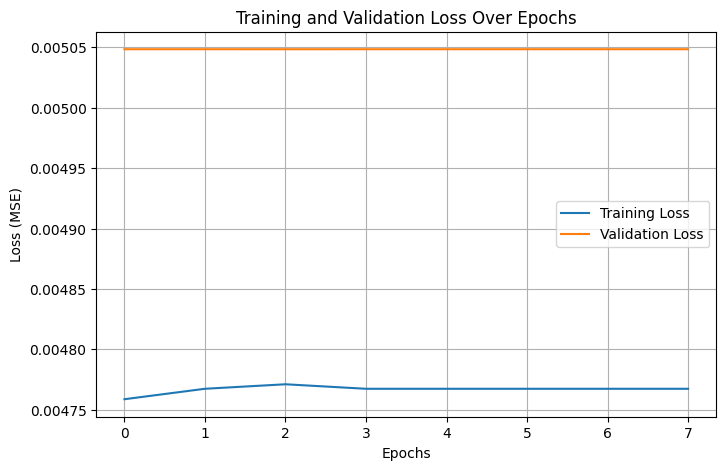

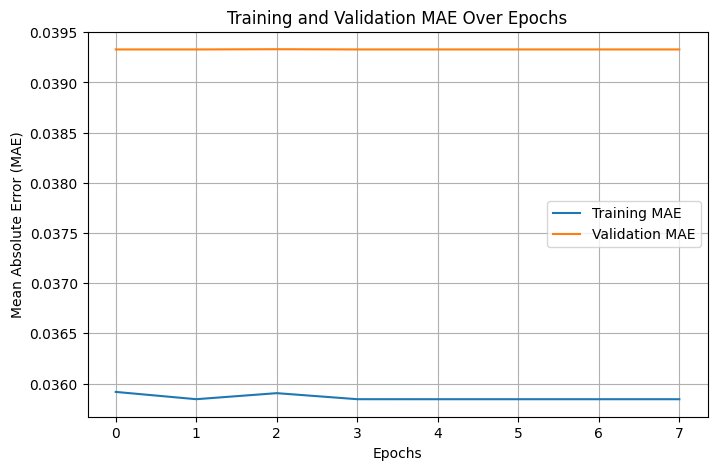

In [43]:
# --- IMPORTS ---
import numpy as np
import cv2
import matplotlib.pyplot as plt


# --- STEP 4: Rebuild and Retrain the Best Model on FULL Data ---
print("\n🔨 Retraining best model on full dataset...")

# Load best parameters from study
best_params = study.best_trial.params
best_depth = best_params['depth']
best_filters = best_params['filters']
best_lr = best_params['lr']

# Build and compile the best model
best_model = build_vdsr_model(best_depth, best_filters)
best_optimizer = optimizers.Adam(learning_rate=best_lr)
best_model.compile(optimizer=best_optimizer, loss='mse', metrics=['mae'])

# Retrain on the full training dataset
history = best_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=15,
    callbacks=[tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)],
    verbose=1
)

# --- STEP 5: Plot Learning Curves (Loss and MAE separately) ---
print("\n📈 Plotting learning curves...")

# Extract history
history_dict = history.history

# Plot Loss
plt.figure(figsize=(8, 5))
plt.plot(history_dict['loss'], label='Training Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)
plt.show()

# Plot MAE
plt.figure(figsize=(8, 5))
plt.plot(history_dict['mae'], label='Training MAE')
plt.plot(history_dict['val_mae'], label='Validation MAE')
plt.title('Training and Validation MAE Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error (MAE)')
plt.legend()
plt.grid(True)
plt.show()




# Training Curves and Early Stopping Analysis

- **Training and Validation Loss (MSE):**
  - Both training and validation loss curves are very flat and close to 0.0050.
  - This indicates that the model quickly converged and no major overfitting or instability occurred during training.

- **Training and Validation MAE:**
  - Training MAE stabilized around 0.0360, and validation MAE stabilized around 0.0395.
  - The small gap between training and validation MAE shows good generalization.

- **Early Stopping Behavior:**
  - Although the model was set to train for 15 epochs, early stopping was triggered after 8 epochs.
  - This is because validation loss did not improve for 5 consecutive epochs (patience=5), so training was halted to prevent overfitting.

- **Conclusion from Curves:**
  - The model learned rapidly within the first few epochs.
  - Most of the learning was completed early, and the model achieved stable and consistent performance across the training and validation datasets.


# Evaluation and Visualization

After training, we evaluate the model's performance on the unseen test dataset.

- **Evaluation Metrics:**
  - **PSNR (Peak Signal-to-Noise Ratio):** Measures the quality of the reconstructed image compared to the ground truth (higher is better).
  - **SSIM (Structural Similarity Index):** Measures perceived similarity (brightness, contrast, structure) between the images (closer to 1 is better).

- **Evaluation Strategy:**
  - The model's predictions are compared to high-resolution (HR) ground truth images.
  - Average PSNR and SSIM scores are computed across all test images.

- **Visualization of Results:**
  - For selected images, the following are displayed:
    - The upscaled low-resolution (LR) input image.
    - The super-resolved output from the model.
    - The original high-resolution (HR) ground truth image.


This step helps assess both the quantitative performance and the qualitative appearance of the super-resolved images.



📈 Evaluating model on the test dataset...


Evaluating: 100%|██████████| 3738/3738 [08:30<00:00,  7.32batch/s]



✅ Test PSNR: 30.74 dB
✅ Test SSIM: 0.7574

🖼️ Visualizing test images with PSNR > 30.75...
Image 42: PSNR = 35.81 dB ✅


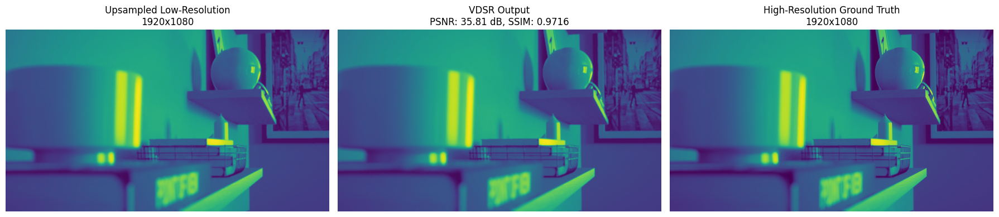

Image 44: PSNR = 31.22 dB ✅


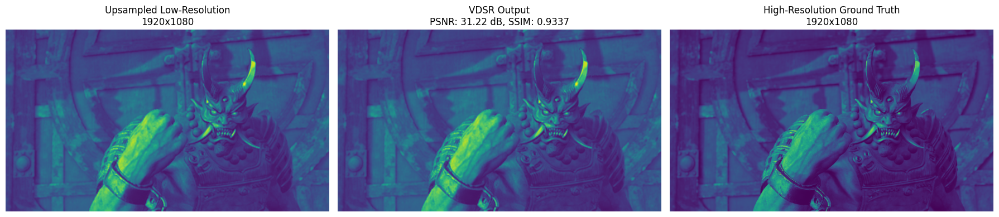

Image 50: PSNR = 36.98 dB ✅


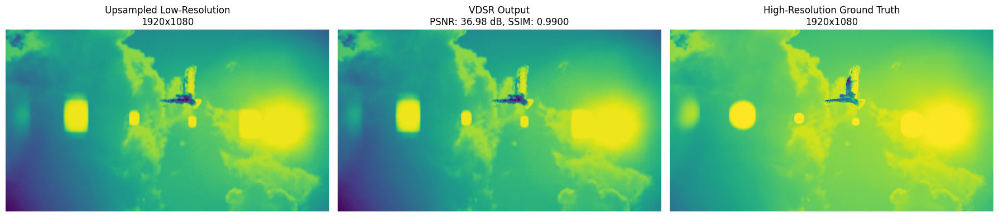

In [45]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm  # <-- new

# --- STEP 2: Define fast evaluation function ---
def evaluate_model(model, dataset):
    psnrs = []
    ssims = []

    print("\n📈 Evaluating model on the test dataset...")
    for lr_batch, hr_batch in tqdm(dataset, desc="Evaluating", unit="batch"):
        preds = model.predict(lr_batch, verbose=0)

        batch_size = preds.shape[0]
        for i in range(batch_size):
            hr_img = hr_batch[i].numpy().squeeze()
            pred_img = preds[i].squeeze()

            psnrs.append(psnr(hr_img, pred_img, data_range=1.0))
            ssims.append(ssim(hr_img, pred_img, data_range=1.0))

    return np.mean(psnrs), np.mean(ssims)

# --- STEP 3: Evaluate on test set ---
test_psnr, test_ssim = evaluate_model(best_model, test_ds)
print(f"\n✅ Test PSNR: {test_psnr:.2f} dB")
print(f"✅ Test SSIM: {test_ssim:.4f}")

# --- STEP 4: Define visualization function ---
def plot_comparison(model, lr_path, hr_path):
    # Load and preprocess images
    lr = preprocess_image(lr_path)  # Should return [0,1] normalized grayscale
    hr = preprocess_image(hr_path)  # Should return [0,1] normalized grayscale

    # Upsample LR to match HR size
    lr_upscaled = cv2.resize(lr, (hr.shape[1], hr.shape[0]), interpolation=cv2.INTER_CUBIC)

    # Prepare model input
    if lr_upscaled.ndim == 2:
        lr_upscaled = np.expand_dims(lr_upscaled, axis=-1)
    lr_input = np.expand_dims(lr_upscaled, axis=0)

    # Predict
    pred = model.predict(lr_input, verbose=0)
    pred = np.squeeze(pred)

    # Calculate PSNR and SSIM
    pred_psnr = psnr(hr, pred, data_range=1.0)
    pred_ssim = ssim(hr, pred, data_range=1.0)

    # Plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(lr_upscaled.squeeze())
    axes[0].set_title(f"Upsampled Low-Resolution\n{lr_upscaled.shape[1]}x{lr_upscaled.shape[0]}")
    axes[0].axis('off')

    axes[1].imshow(pred)
    axes[1].set_title(f"VDSR Output\nPSNR: {pred_psnr:.2f} dB, SSIM: {pred_ssim:.4f}")
    axes[1].axis('off')

    axes[2].imshow(hr)
    axes[2].set_title(f"High-Resolution Ground Truth\n{hr.shape[1]}x{hr.shape[0]}")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# --- STEP 5: Visualize test images with PSNR > 30.75 ---
print("\n🖼️ Visualizing test images with PSNR > 30.75...")

images_shown = 0
max_images = 3

for i in range(len(paths['test_hr'])):
    # Load and preprocess
    lr = preprocess_image(paths['test_lr'][i])
    hr = preprocess_image(paths['test_hr'][i])

    lr_upscaled = cv2.resize(lr, (hr.shape[1], hr.shape[0]), interpolation=cv2.INTER_CUBIC)
    if lr_upscaled.ndim == 2:
        lr_upscaled = np.expand_dims(lr_upscaled, axis=-1)
    lr_input = np.expand_dims(lr_upscaled, axis=0)

    pred = best_model.predict(lr_input, verbose=0)
    pred = np.squeeze(pred)

    # Calculate PSNR
    pred_psnr = psnr(hr, pred, data_range=1.0)

    if pred_psnr > 30.75:
        print(f"Image {i}: PSNR = {pred_psnr:.2f} dB ✅")
        plot_comparison(best_model, paths['test_lr'][i], paths['test_hr'][i])
        images_shown += 1

    if images_shown >= max_images:
        break

if images_shown == 0:
    print("No images found with PSNR > 30.75.")



# Final Test Results

After evaluation on the test set, the final model achieved:

- **Test PSNR:** 30.74 dB
- **Test SSIM:** 0.7574

✅ The PSNR score indicates reasonable pixel-level reconstruction quality compared to the ground truth.  
✅ The SSIM score shows moderate structural similarity, although there is still room for improvement, especially for finer textures.

These results establish a strong baseline for future improvements.
